In [1]:
from PIL import Image
import tqdm
import os
import time
import collections

import torch
import torchvision
assert torch.cuda.is_available()
from torchvision.transforms import ToTensor
from torch.nn import functional as F

import numpy as np
import matplotlib.pyplot as plt

AMOUNT = None
BATCH_SIZE = 22
VAL_SIZE = 0.2
IM_SIZE = (64, 64)
DEVICE = 'cuda:0'

----------------
## Создание Custom Dataset  и DataLoader
Объект класса ImageDataset подгружает файл с нужным изображением при вызове метода \__getitem__.

Работа происходит в цветовом пространстве HSV:
- hue - оттенок (image[0]),
- saturation - насыщенность (image[1]),
- value - значение яркости (image[2])

Яркость будет неизменным и опорным значением для модели, по которому будут рассчитываться два оставшихся параметра, влияющих на цвет.


In [2]:
def dataset_preparation(in_path, out_path, im_size):
    ''' перезаписывает файлы в другую папку + resize '''
    files_list = os.listdir(in_path)
    if not os.path.exists(out_path):
        os.makedirs(out_path)
    for file_n in tqdm.tqdm(files_list):
        with Image.open(in_path+file_n) as file:
            file.resize(im_size).save(out_path+file_n)

class ImageDataset(torch.utils.data.Dataset):
    ''' 
    Формат файлов: png или jpg
    amount - временное решение по ограничению кол-ва обучающих данных
    '''
    
    def __init__(self, path, transforms, amount = None, to_hsv = True):
        self.transforms = transforms
        self.to_hsv = to_hsv
        self.path = path
        
        is_image_filter = lambda value:('png' in value) or ('jpg' in value) or ('JPEG' in value)
        self.f_names = list(filter(is_image_filter, os.listdir(path)))[:amount]
        self.len = len(self.f_names)
        
    
    def __len__(self):
        return self.len
    
    def __getitem__(self, index):
        with Image.open(self.path + self.f_names[index]) as file:
            image = self.transforms(file.convert('HSV')) 
            return image[2].unsqueeze(0), image[:2]     # unsqueeze на случай реализации vgg16
                                                        # image shape - [hue, sat, val], return [newax, h, s]

transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
#     torchvision.transforms.Normalize(mean = 0.5, std=0.5)
])
# dataset_preparation(in_path = 'imagenet_val/',
#                     out_path = 'im_dataset/',
#                     im_size = IM_SIZE)
dataset = ImageDataset(path = 'im_dataset/', transforms = transforms, amount = AMOUNT)

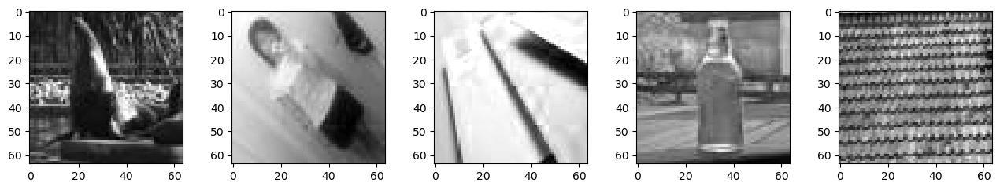

In [3]:
%matplotlib inline
_, ax = plt.subplots(1, 5, figsize = (13, 5))
plt.tight_layout()
for i in range(5):
    ax[i].imshow(dataset[i][0].permute(1, 2, 0), cmap = 'gray')

In [4]:
def val_split(dataset, val_size):
    ''' val_size задается в диапазоне 0..1 '''
    val_length = int(np.round(len(dataset) * val_size))
    val_idx = range(val_length)
    train_idx = range(val_length, len(dataset))
    
    train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
    val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)
    
    return train_sampler, val_sampler

train_sampler, val_sampler = val_split(dataset, val_size = VAL_SIZE)
train_loader = torch.utils.data.DataLoader(dataset, batch_size = BATCH_SIZE, sampler = train_sampler, drop_last = True)
val_loader = torch.utils.data.DataLoader(dataset, batch_size = BATCH_SIZE, sampler = val_sampler, drop_last = True)

---------------------------------------
## Архитектура модели
VGG в качестве feature extractor

In [5]:
class StylerNet(torch.nn.Module):
    ''' '''
    
    def __init__(self, optim):
        super(StylerNet, self).__init__()

        feature_extractor = torchvision.models.vgg16(pretrained = True)
        self.l1_encoder = torch.nn.Sequential(
            collections.OrderedDict({
                'conv1': feature_extractor.features[:5],
                'conv2': feature_extractor.features[5:10],
                'conv3': feature_extractor.features[10:17],
                'conv4': feature_extractor.features[17:30]
            })
        )
        for param in self.l1_encoder.parameters():
            param.requires_grad = False
        
        self.l2_decoder = torch.nn.Sequential(
            collections.OrderedDict({
                'convTranspose1': torch.nn.Sequential(
                    torch.nn.ConvTranspose2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.ConvTranspose2d(in_channels = 512, out_channels = 256, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(256)
                ),
                'convTranspose2': torch.nn.Sequential(
                    torch.nn.ConvTranspose2d(in_channels = 512, out_channels = 256, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(128),
                ),
                'convTranspose3': torch.nn.Sequential(            
                    torch.nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(64),
                ),
                'convTranspose4': torch.nn.Sequential(
                    torch.nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.ConvTranspose2d(in_channels = 64, out_channels = 32, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(32),
                ),
                'convOut': torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels = 32, out_channels = 2, kernel_size = 3, padding = 1),
                    torch.nn.BatchNorm2d(2),
                    torch.nn.ReLU()
                )
            })    
        )
        self.loss_fn = torch.nn.MSELoss()
        self.optim = optim(self.parameters(), lr = .01)
        
    def forward(self, x):
        x = torch.cat([x, x, x], axis=1)
        
        x1 = self.l1_encoder.conv1(x)          # (, 64, 64, 64)
        x2 = self.l1_encoder.conv2(x1)         # (, 128, 32, 32)
        x3 = self.l1_encoder.conv3(x2)         # (, 256, 16, 16)
        
        x4 = self.l1_encoder.conv4(x3)         # (, 512, 8, 8)
        x = self.l2_decoder.convTranspose1(x4) # (, 1024, 4, 4)
        
        x = torch.cat((x, x3), dim = 1)        # ( , 512, 16, 16)
        x = self.l2_decoder.convTranspose2(x)  
        x = torch.cat((x, x2), dim = 1)        # ( , 256, 32, 32)
        x = self.l2_decoder.convTranspose3(x)
        x = torch.cat((x, x1), dim = 1)        # ( , 128, 64, 64)
        x = self.l2_decoder.convTranspose4(x)  # ( , 32, 128, 128)
        
        x = self.l2_decoder.convOut(x)
        return x
    
    def calc_loss(self, outputs, targets):
        return self.loss_fn(outputs, targets)
            
    def predict(self, inputs):
        topillow = torchvision.transforms.ToPILImage('HSV')
        image = topillow(torch.hstack([self(inputs.to(DEVICE)), inputs.to(DEVICE)])[0])
        return image
    def checkpoint(self, direction, epoch):
        torch.save(self.state_dict, direction + f'model_{epoch}')
    def load_checkpoint(self, direction, epoch):
        self.load_state_dict(torch.load(direction + f'model_{epoch}')())

--------------
## Обучение

In [6]:
def train_model3(model, train_loader, epochs = 1, device = DEVICE):
    model.to(device)
    model.train()
    
    # для val_loss
    calc_loss = torch.nn.MSELoss()
    topillow = torchvision.transforms.ToPILImage('HSV')
    image = next(iter(train_loader))     # image shape   [[s, h], v]
    
    point = np.ceil(len(train_loader) / 10)
    loss = np.array([])
    
    for epoch in range(epochs):
        model.to(device)
        start_time = time.time()
        print(f'Epoch {epoch}/{epochs}: <', end = '')
        
        for i, (inputs, targets) in enumerate(train_loader):
            model.optim.zero_grad()
            model_outs = model(inputs.to(device))
            model_loss = model.calc_loss(model_outs, targets.to(device))
            model_loss.backward()
            model.optim.step()
            
            
            if not i % point:
                print('=', end = '')
                
        print(f'> ------- model loss = {model_loss}, time = {np.round(time.time() - start_time)}s')
        
        loss = np.append(loss, model_loss.detach().to('cpu').numpy())
        
        
        if not epoch % 5:
            model.checkpoint('checkpoints/', epoch)
            
            # расчет validation loss    
            with torch.no_grad():                  
                val_loss = 0
                for i, (inputs, targets) in enumerate(val_loader):
                    outputs = model(inputs.to(device))
                    val_loss += calc_loss(outputs, targets.to(device))
                val_loss = val_loss / i
                print(f'\nValidation loss = {val_loss}')
                
                # визуальный вывод
                fake_im = model.predict(image[0])
                real_im = topillow(torch.hstack((image[1], image[0]))[0])
                _, ax = plt.subplots(1, 3, figsize = (10, 2))
                plt.tight_layout()
                ax[0].set_title('fake image')
                ax[0].imshow(fake_im)
                ax[1].set_title('real image')
                ax[1].imshow(real_im)
                ax[2].set_title('losses')
                ax[2].plot(loss, label = 'model loss')
                ax[2].legend()
                plt.show()
                

    return loss

In [8]:
model = StylerNet(optim = torch.optim.Adam)
model_params_amount = (sum(p.numel() for p in model.parameters()))
print(f'Количество параметров модели: {model_params_amount}')

Количество параметров модели: 20191974


Epoch 0/1000: <==========> ------- model loss = 0.5892492532730103, time = 56.0s

Validation loss = 0.06629473716020584


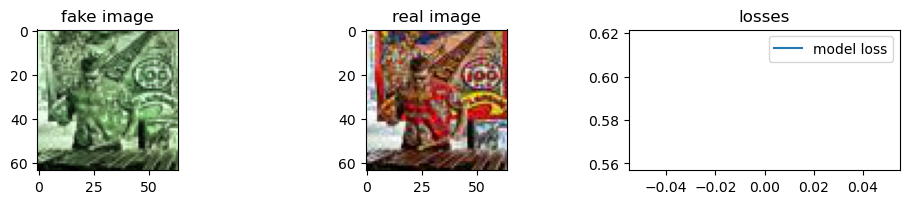

Epoch 1/1000: <==========> ------- model loss = 0.5806788802146912, time = 56.0s
Epoch 2/1000: <==========> ------- model loss = 0.5859835147857666, time = 56.0s
Epoch 3/1000: <==========> ------- model loss = 0.6101014614105225, time = 56.0s
Epoch 4/1000: <==========> ------- model loss = 0.5794645547866821, time = 56.0s
Epoch 5/1000: <==========> ------- model loss = 0.5665217638015747, time = 56.0s

Validation loss = 0.06485149264335632


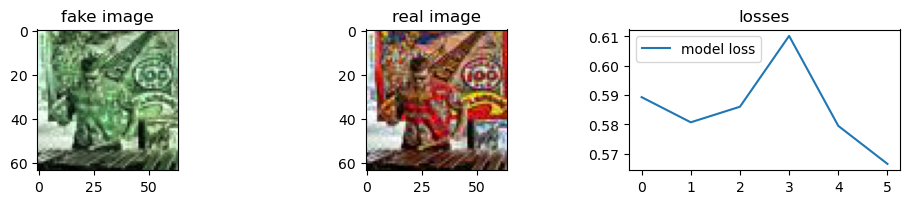

Epoch 6/1000: <==========> ------- model loss = 0.5814269185066223, time = 57.0s
Epoch 7/1000: <==========> ------- model loss = 0.5888673663139343, time = 56.0s
Epoch 8/1000: <==========> ------- model loss = 0.5647663474082947, time = 56.0s
Epoch 9/1000: <==========> ------- model loss = 0.5798913240432739, time = 57.0s
Epoch 10/1000: <==========> ------- model loss = 0.5589204430580139, time = 57.0s

Validation loss = 0.0740964487195015


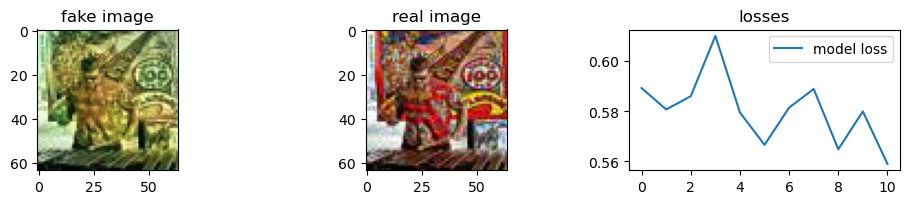

Epoch 11/1000: <==========> ------- model loss = 0.5502968430519104, time = 57.0s
Epoch 12/1000: <==========> ------- model loss = 0.5669393539428711, time = 56.0s
Epoch 13/1000: <==========> ------- model loss = 0.49870699644088745, time = 57.0s
Epoch 14/1000: <==========> ------- model loss = 0.5239548683166504, time = 57.0s
Epoch 15/1000: <==========> ------- model loss = 0.5082802772521973, time = 57.0s

Validation loss = 0.08101924508810043


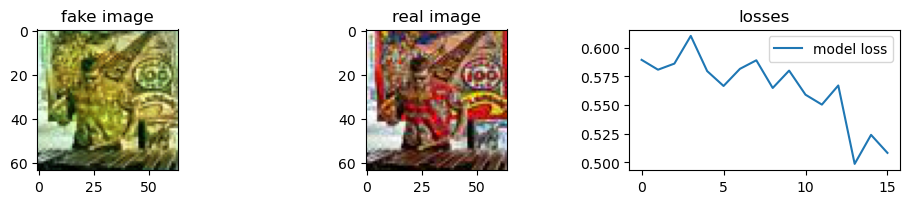

Epoch 16/1000: <==========> ------- model loss = 0.511544942855835, time = 56.0s
Epoch 17/1000: <==========> ------- model loss = 0.5517448782920837, time = 57.0s
Epoch 18/1000: <==========> ------- model loss = 0.5094359517097473, time = 57.0s
Epoch 19/1000: <==========> ------- model loss = 0.5093576312065125, time = 57.0s
Epoch 20/1000: <==========> ------- model loss = 0.5262284278869629, time = 57.0s

Validation loss = 0.08401120454072952


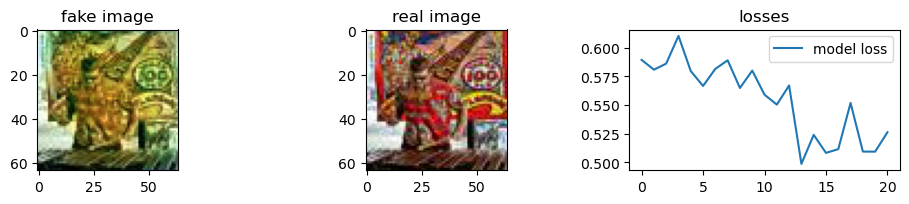

Epoch 21/1000: <==========> ------- model loss = 0.5098468661308289, time = 57.0s
Epoch 22/1000: <==========> ------- model loss = 0.5221861600875854, time = 57.0s
Epoch 23/1000: <==========> ------- model loss = 0.49101489782333374, time = 57.0s
Epoch 24/1000: <==========> ------- model loss = 0.5115265250205994, time = 57.0s
Epoch 25/1000: <==========> ------- model loss = 0.5044381022453308, time = 56.0s

Validation loss = 0.08608099073171616


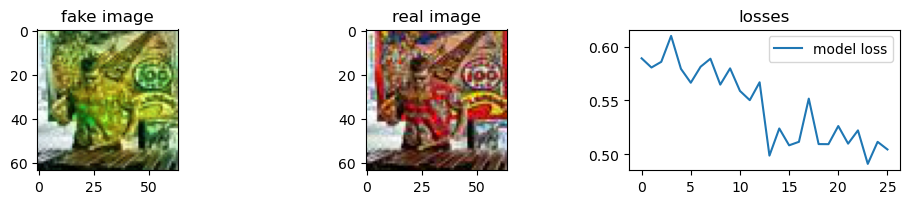

Epoch 26/1000: <==========> ------- model loss = 0.5109032988548279, time = 56.0s
Epoch 27/1000: <==========> ------- model loss = 0.5102977752685547, time = 56.0s
Epoch 28/1000: <==========> ------- model loss = 0.5008234977722168, time = 56.0s
Epoch 29/1000: <==========> ------- model loss = 0.48663976788520813, time = 57.0s
Epoch 30/1000: <==========> ------- model loss = 0.4800992012023926, time = 57.0s

Validation loss = 0.08711818605661392


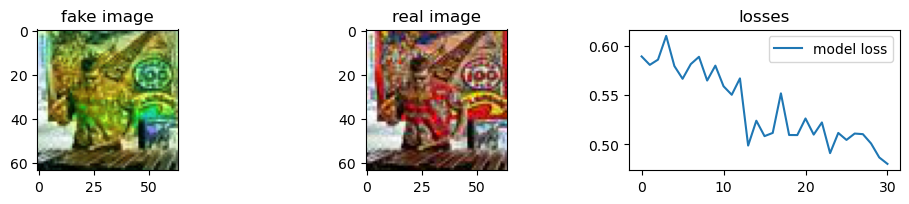

Epoch 31/1000: <==========> ------- model loss = 0.54230797290802, time = 56.0s
Epoch 32/1000: <==========> ------- model loss = 0.47654885053634644, time = 57.0s
Epoch 33/1000: <==========> ------- model loss = 0.48073604702949524, time = 57.0s
Epoch 34/1000: <==========> ------- model loss = 0.5166618227958679, time = 57.0s
Epoch 35/1000: <==========> ------- model loss = 0.502288818359375, time = 57.0s

Validation loss = 0.0865301638841629


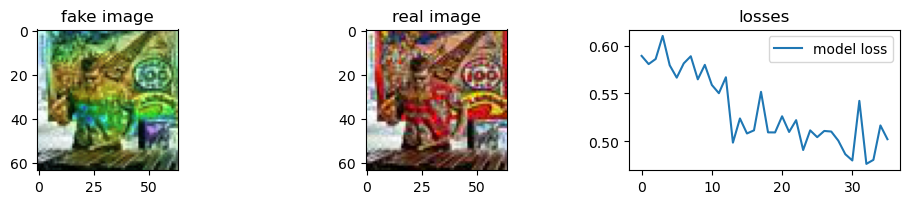

Epoch 36/1000: <==========> ------- model loss = 0.4757797122001648, time = 56.0s
Epoch 37/1000: <==========> ------- model loss = 0.47829529643058777, time = 57.0s
Epoch 38/1000: <==========> ------- model loss = 0.4581223428249359, time = 57.0s
Epoch 39/1000: <==========> ------- model loss = 0.49756869673728943, time = 57.0s
Epoch 40/1000: <==========> ------- model loss = 0.5078405737876892, time = 57.0s

Validation loss = 0.08901472389698029


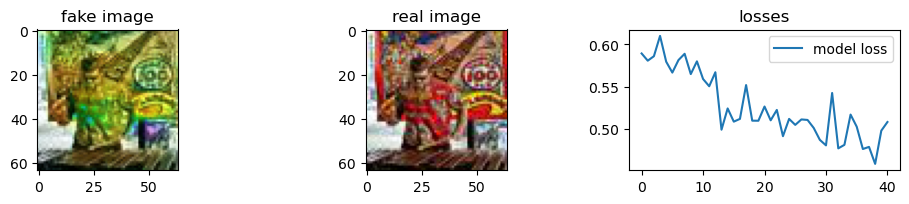

Epoch 41/1000: <==========> ------- model loss = 0.4773843586444855, time = 57.0s
Epoch 42/1000: <==========> ------- model loss = 0.4874056279659271, time = 57.0s
Epoch 43/1000: <==========> ------- model loss = 0.5285191535949707, time = 57.0s
Epoch 44/1000: <==========> ------- model loss = 0.478493869304657, time = 57.0s
Epoch 45/1000: <==========> ------- model loss = 0.4594651162624359, time = 57.0s

Validation loss = 0.0891149714589119


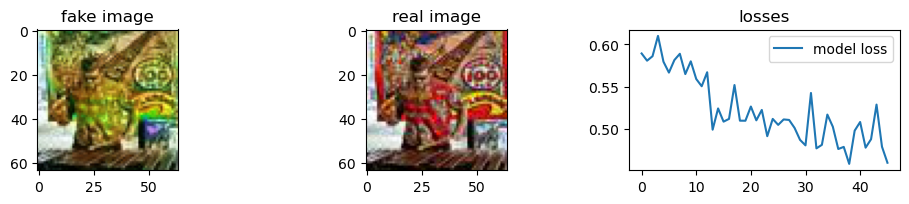

Epoch 46/1000: <==========> ------- model loss = 0.47514456510543823, time = 57.0s
Epoch 47/1000: <==========> ------- model loss = 0.5071654319763184, time = 57.0s
Epoch 48/1000: <==========> ------- model loss = 0.5142879486083984, time = 57.0s
Epoch 49/1000: <==========> ------- model loss = 0.5411387085914612, time = 57.0s
Epoch 50/1000: <==========> ------- model loss = 0.5422301888465881, time = 57.0s

Validation loss = 0.08846426010131836


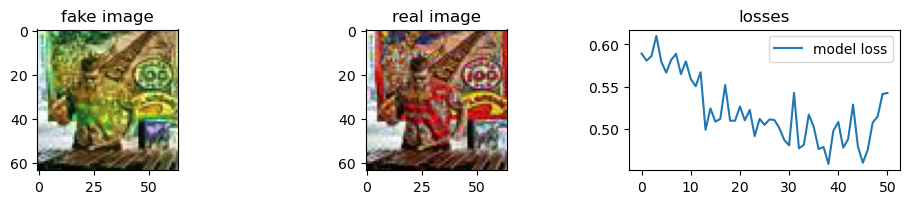

Epoch 51/1000: <==========> ------- model loss = 0.508015513420105, time = 57.0s
Epoch 52/1000: <==========> ------- model loss = 0.5067582726478577, time = 57.0s
Epoch 53/1000: <==========> ------- model loss = 0.5197447538375854, time = 57.0s
Epoch 54/1000: <==========> ------- model loss = 0.5228828191757202, time = 57.0s
Epoch 55/1000: <==========> ------- model loss = 0.5045931935310364, time = 57.0s

Validation loss = 0.0870731845498085


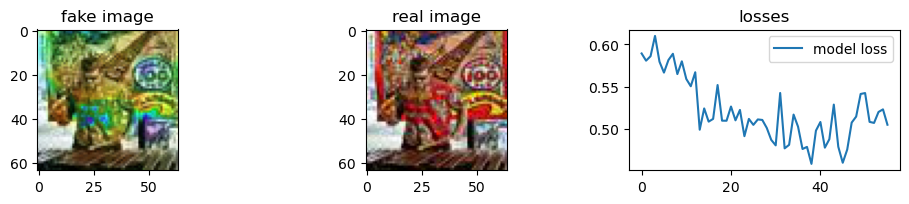

Epoch 56/1000: <==========> ------- model loss = 0.4887968897819519, time = 57.0s
Epoch 57/1000: <==========> ------- model loss = 0.4823639392852783, time = 57.0s
Epoch 58/1000: <==========> ------- model loss = 0.4698297083377838, time = 57.0s
Epoch 59/1000: <==========> ------- model loss = 0.4962574541568756, time = 57.0s
Epoch 60/1000: <==========> ------- model loss = 0.5057504177093506, time = 57.0s

Validation loss = 0.08963083475828171


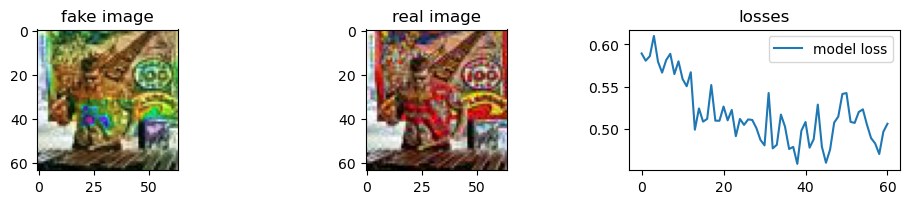

Epoch 61/1000: <==========> ------- model loss = 0.49787116050720215, time = 57.0s
Epoch 62/1000: <==========> ------- model loss = 0.4978497326374054, time = 57.0s
Epoch 63/1000: <==========> ------- model loss = 0.4836041331291199, time = 57.0s
Epoch 64/1000: <==========> ------- model loss = 0.5333461761474609, time = 57.0s
Epoch 65/1000: <==========> ------- model loss = 0.5041928291320801, time = 57.0s

Validation loss = 0.08896775543689728


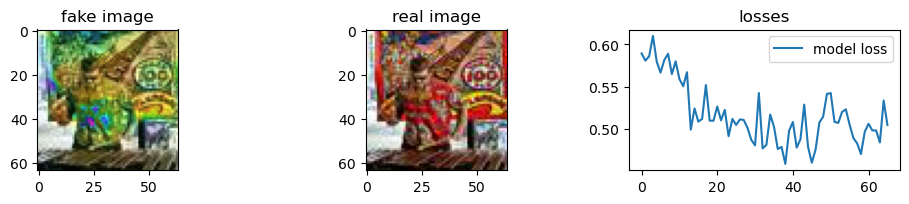

Epoch 66/1000: <==========> ------- model loss = 0.5078597068786621, time = 57.0s
Epoch 67/1000: <==========> ------- model loss = 0.448048859834671, time = 57.0s
Epoch 68/1000: <==========> ------- model loss = 0.49238651990890503, time = 57.0s
Epoch 69/1000: <==========> ------- model loss = 0.4848707616329193, time = 57.0s
Epoch 70/1000: <==========> ------- model loss = 0.4963659644126892, time = 57.0s

Validation loss = 0.08862720429897308


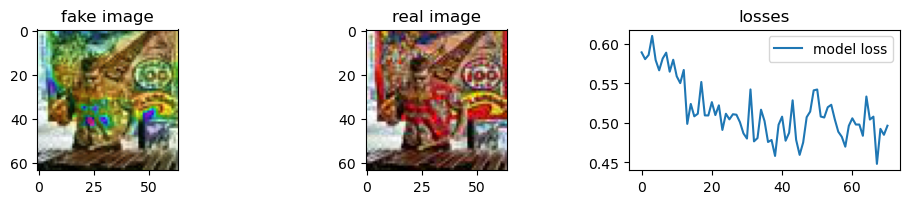

Epoch 71/1000: <==========> ------- model loss = 0.491595983505249, time = 57.0s
Epoch 72/1000: <==========> ------- model loss = 0.47010257840156555, time = 57.0s
Epoch 73/1000: <==========> ------- model loss = 0.4544411599636078, time = 57.0s
Epoch 74/1000: <==========> ------- model loss = 0.4870811104774475, time = 57.0s
Epoch 75/1000: <==========> ------- model loss = 0.500850260257721, time = 56.0s

Validation loss = 0.08910708129405975


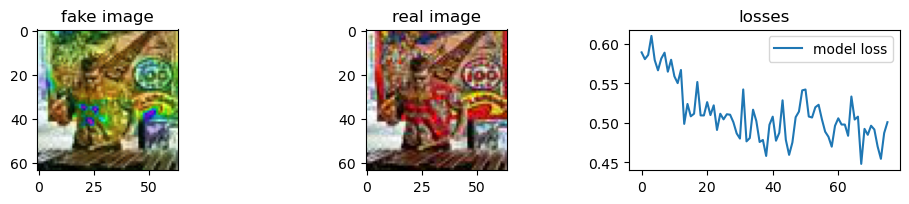

Epoch 76/1000: <==========> ------- model loss = 0.4754253029823303, time = 56.0s
Epoch 77/1000: <==========> ------- model loss = 0.5208394527435303, time = 56.0s
Epoch 78/1000: <==========> ------- model loss = 0.44672951102256775, time = 57.0s
Epoch 79/1000: <==========> ------- model loss = 0.4996858239173889, time = 57.0s
Epoch 80/1000: <==========> ------- model loss = 0.4806753098964691, time = 57.0s

Validation loss = 0.08602011203765869


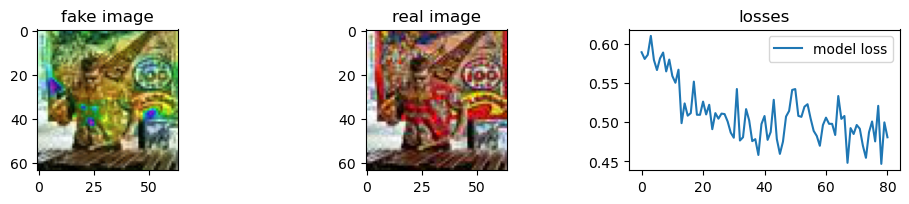

Epoch 81/1000: <==========> ------- model loss = 0.4859970510005951, time = 57.0s
Epoch 82/1000: <==========> ------- model loss = 0.5253801345825195, time = 57.0s
Epoch 83/1000: <==========> ------- model loss = 0.46920889616012573, time = 57.0s
Epoch 84/1000: <==========> ------- model loss = 0.5135800242424011, time = 57.0s
Epoch 85/1000: <==========> ------- model loss = 0.47845014929771423, time = 57.0s

Validation loss = 0.0865761861205101


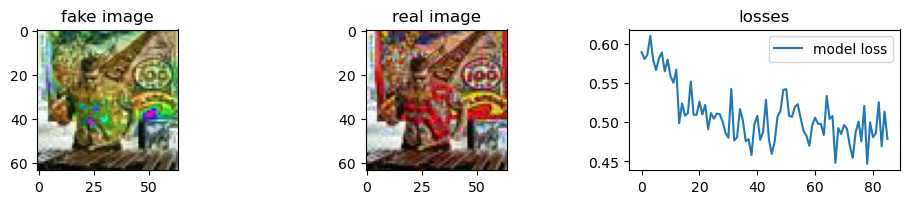

Epoch 86/1000: <==========> ------- model loss = 0.5072072148323059, time = 57.0s
Epoch 87/1000: <==========> ------- model loss = 0.499944269657135, time = 57.0s
Epoch 88/1000: <==========> ------- model loss = 0.4663276672363281, time = 57.0s
Epoch 89/1000: <==========> ------- model loss = 0.49348706007003784, time = 57.0s
Epoch 90/1000: <==========> ------- model loss = 0.5443164110183716, time = 57.0s

Validation loss = 0.08544085174798965


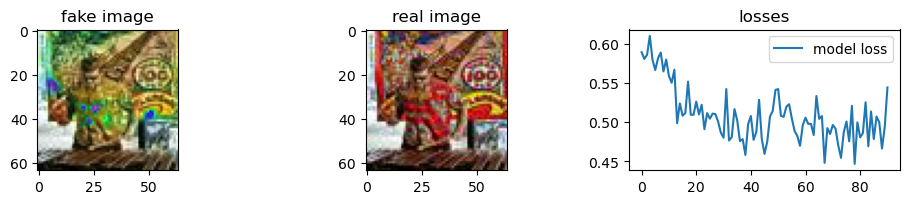

Epoch 91/1000: <==========> ------- model loss = 0.43096160888671875, time = 57.0s
Epoch 92/1000: <==========> ------- model loss = 0.4789281487464905, time = 56.0s
Epoch 93/1000: <==========> ------- model loss = 0.46573740243911743, time = 56.0s
Epoch 94/1000: <==========> ------- model loss = 0.48058661818504333, time = 57.0s
Epoch 95/1000: <==========> ------- model loss = 0.4729689955711365, time = 56.0s

Validation loss = 0.08661439269781113


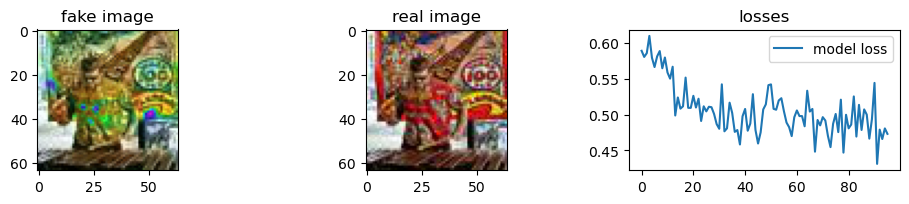

Epoch 96/1000: <==========> ------- model loss = 0.4883020222187042, time = 56.0s
Epoch 97/1000: <==========> ------- model loss = 0.4659644067287445, time = 56.0s
Epoch 98/1000: <==========> ------- model loss = 0.49459928274154663, time = 56.0s
Epoch 99/1000: <==========> ------- model loss = 0.4880099892616272, time = 57.0s
Epoch 100/1000: <==========> ------- model loss = 0.45813441276550293, time = 56.0s

Validation loss = 0.08590399473905563


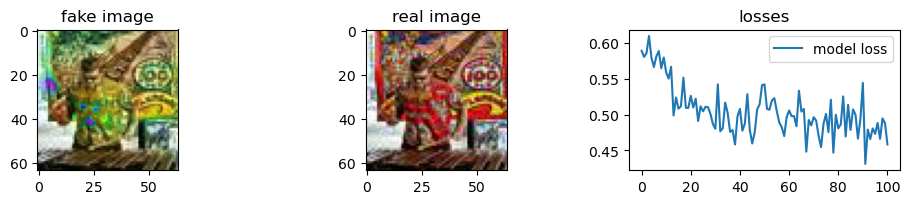

Epoch 101/1000: <==========> ------- model loss = 0.5077621340751648, time = 57.0s
Epoch 102/1000: <==========> ------- model loss = 0.4746088683605194, time = 56.0s
Epoch 103/1000: <==========> ------- model loss = 0.46892309188842773, time = 57.0s
Epoch 104/1000: <==========> ------- model loss = 0.49265173077583313, time = 57.0s
Epoch 105/1000: <==========> ------- model loss = 0.4312821328639984, time = 57.0s

Validation loss = 0.08930451422929764


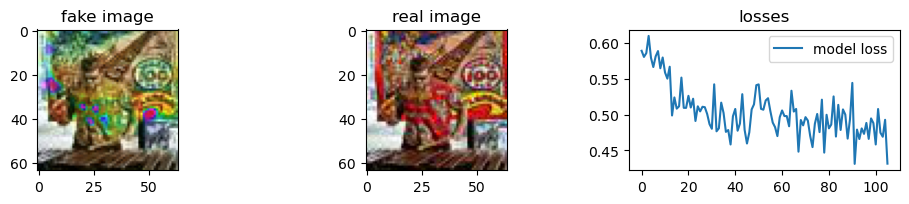

Epoch 106/1000: <==========> ------- model loss = 0.48065322637557983, time = 57.0s
Epoch 107/1000: <==========> ------- model loss = 0.5177251100540161, time = 57.0s
Epoch 108/1000: <==========> ------- model loss = 0.44852837920188904, time = 57.0s
Epoch 109/1000: <==========> ------- model loss = 0.4286235570907593, time = 57.0s
Epoch 110/1000: <==========> ------- model loss = 0.5018492937088013, time = 57.0s

Validation loss = 0.08839230984449387


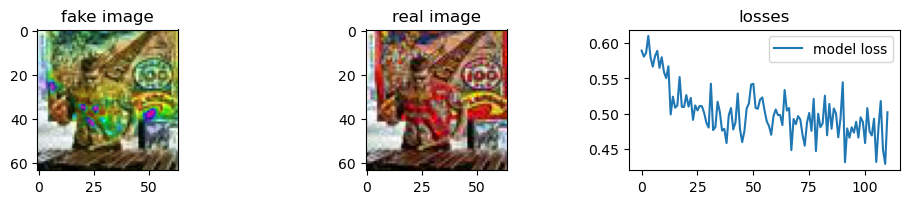

Epoch 111/1000: <==========> ------- model loss = 0.4983650743961334, time = 57.0s
Epoch 112/1000: <==========> ------- model loss = 0.4608675539493561, time = 57.0s
Epoch 113/1000: <==========> ------- model loss = 0.5092485547065735, time = 57.0s
Epoch 114/1000: <==========> ------- model loss = 0.47791314125061035, time = 57.0s
Epoch 115/1000: <==========> ------- model loss = 0.4637845754623413, time = 57.0s

Validation loss = 0.08770564943552017


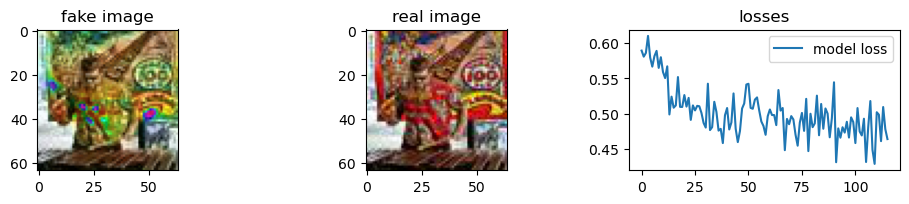

Epoch 116/1000: <==========> ------- model loss = 0.49816033244132996, time = 57.0s
Epoch 117/1000: <==========> ------- model loss = 0.4785507619380951, time = 57.0s
Epoch 118/1000: <==========> ------- model loss = 0.4658938944339752, time = 56.0s
Epoch 119/1000: <==========> ------- model loss = 0.490753710269928, time = 57.0s
Epoch 120/1000: <==========> ------- model loss = 0.4609243869781494, time = 56.0s

Validation loss = 0.08645009249448776


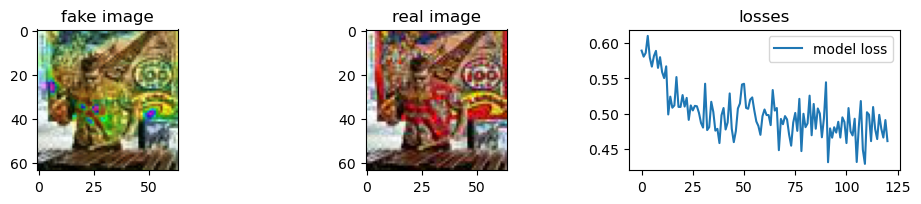

Epoch 121/1000: <==========> ------- model loss = 0.4820542335510254, time = 57.0s
Epoch 122/1000: <==========> ------- model loss = 0.410216748714447, time = 56.0s
Epoch 123/1000: <==========> ------- model loss = 0.4972292482852936, time = 57.0s
Epoch 124/1000: <==========> ------- model loss = 0.4622001647949219, time = 57.0s
Epoch 125/1000: <==========> ------- model loss = 0.46052345633506775, time = 57.0s

Validation loss = 0.08563745021820068


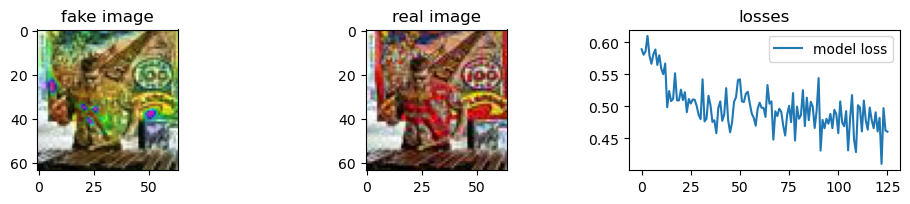

Epoch 126/1000: <==========> ------- model loss = 0.45100724697113037, time = 56.0s
Epoch 127/1000: <==========> ------- model loss = 0.5088418126106262, time = 56.0s
Epoch 128/1000: <==========> ------- model loss = 0.46179771423339844, time = 56.0s
Epoch 129/1000: <==========> ------- model loss = 0.4905494451522827, time = 57.0s
Epoch 130/1000: <==========> ------- model loss = 0.48947590589523315, time = 56.0s

Validation loss = 0.08814607560634613


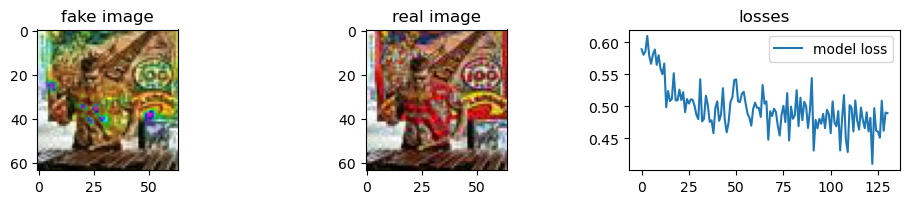

Epoch 131/1000: <==========> ------- model loss = 0.5147678852081299, time = 56.0s
Epoch 132/1000: <==========> ------- model loss = 0.4597124755382538, time = 57.0s
Epoch 133/1000: <==========> ------- model loss = 0.4866391122341156, time = 56.0s
Epoch 134/1000: <==========> ------- model loss = 0.5576909184455872, time = 56.0s
Epoch 135/1000: <==========> ------- model loss = 0.4897918403148651, time = 56.0s

Validation loss = 0.08731560409069061


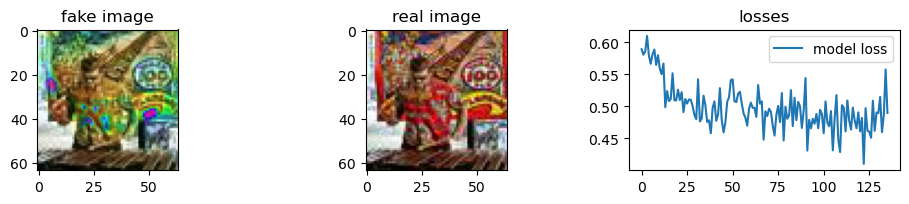

Epoch 136/1000: <==========> ------- model loss = 0.5117754936218262, time = 56.0s
Epoch 137/1000: <==========> ------- model loss = 0.5094106793403625, time = 56.0s
Epoch 138/1000: <==========> ------- model loss = 0.49709615111351013, time = 56.0s
Epoch 139/1000: <==========> ------- model loss = 0.4621186852455139, time = 56.0s
Epoch 140/1000: <==========> ------- model loss = 0.4659576416015625, time = 56.0s

Validation loss = 0.08764797449111938


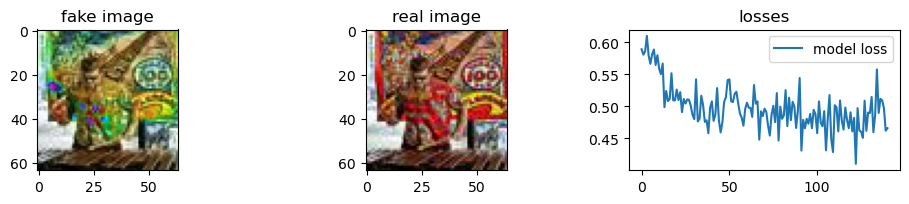

Epoch 141/1000: <==========> ------- model loss = 0.4653678834438324, time = 56.0s
Epoch 142/1000: <==========> ------- model loss = 0.5858839154243469, time = 56.0s
Epoch 143/1000: <==========> ------- model loss = 0.53302401304245, time = 56.0s
Epoch 144/1000: <==========> ------- model loss = 0.4644293785095215, time = 56.0s
Epoch 145/1000: <==========> ------- model loss = 0.4333573877811432, time = 56.0s

Validation loss = 0.08631771802902222


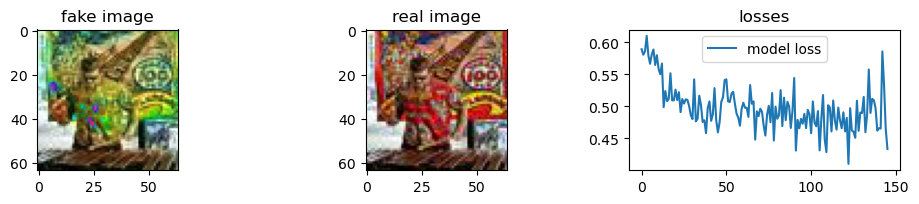

Epoch 146/1000: <==========> ------- model loss = 0.4538570046424866, time = 56.0s
Epoch 147/1000: <==========> ------- model loss = 0.4994358420372009, time = 56.0s
Epoch 148/1000: <==========> ------- model loss = 0.46940797567367554, time = 56.0s
Epoch 149/1000: <==========> ------- model loss = 0.48571038246154785, time = 56.0s
Epoch 150/1000: <==========> ------- model loss = 0.46770474314689636, time = 56.0s

Validation loss = 0.08931708335876465


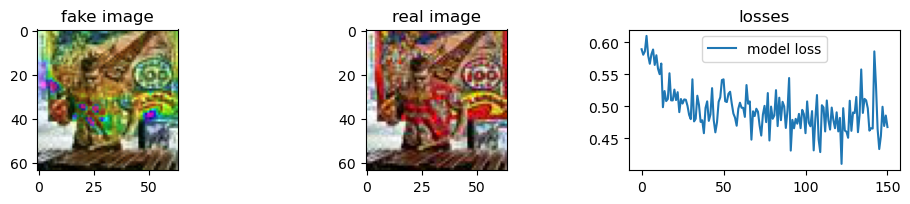

Epoch 151/1000: <==========> ------- model loss = 0.47979530692100525, time = 56.0s
Epoch 152/1000: <==========> ------- model loss = 0.49581098556518555, time = 56.0s
Epoch 153/1000: <==========> ------- model loss = 0.5087389945983887, time = 56.0s
Epoch 154/1000: <==========> ------- model loss = 0.46779513359069824, time = 56.0s
Epoch 155/1000: <==========> ------- model loss = 0.4402627646923065, time = 56.0s

Validation loss = 0.0873604342341423


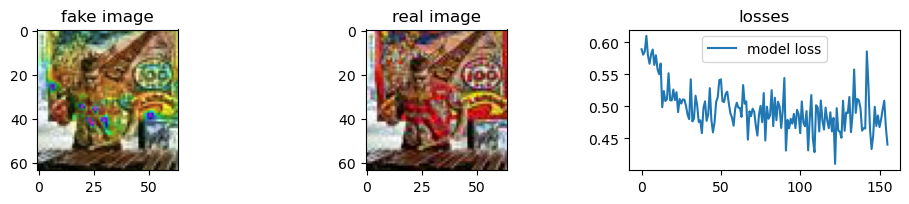

Epoch 156/1000: <==========> ------- model loss = 0.48365992307662964, time = 56.0s
Epoch 157/1000: <==========> ------- model loss = 0.5188676714897156, time = 56.0s
Epoch 158/1000: <==========> ------- model loss = 0.5029841065406799, time = 56.0s
Epoch 159/1000: <==========> ------- model loss = 0.49508461356163025, time = 56.0s
Epoch 160/1000: <==========> ------- model loss = 0.46187275648117065, time = 56.0s

Validation loss = 0.08866088837385178


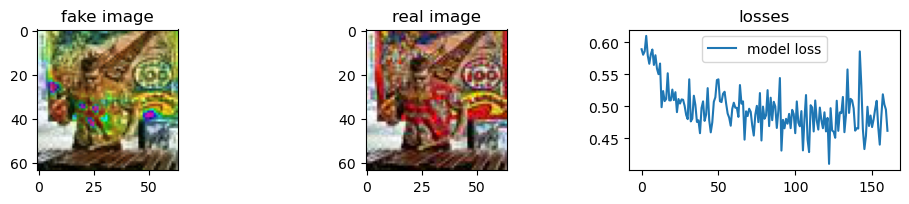

Epoch 161/1000: <==========> ------- model loss = 0.4935917556285858, time = 56.0s
Epoch 162/1000: <==========> ------- model loss = 0.4868873357772827, time = 56.0s
Epoch 163/1000: <==========> ------- model loss = 0.42061659693717957, time = 56.0s
Epoch 164/1000: <==========> ------- model loss = 0.49542850255966187, time = 56.0s
Epoch 165/1000: <==========> ------- model loss = 0.4661317467689514, time = 56.0s

Validation loss = 0.09134672582149506


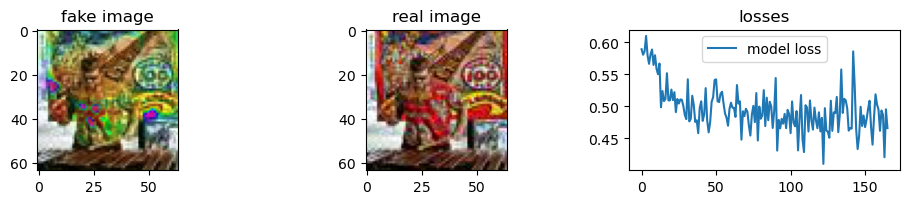

Epoch 166/1000: <==========> ------- model loss = 0.4835633933544159, time = 56.0s
Epoch 167/1000: <==========> ------- model loss = 0.5227544903755188, time = 56.0s
Epoch 168/1000: <==========> ------- model loss = 0.4448566436767578, time = 56.0s
Epoch 169/1000: <==========> ------- model loss = 0.48923441767692566, time = 56.0s
Epoch 170/1000: <==========> ------- model loss = 0.43124842643737793, time = 57.0s

Validation loss = 0.08902113139629364


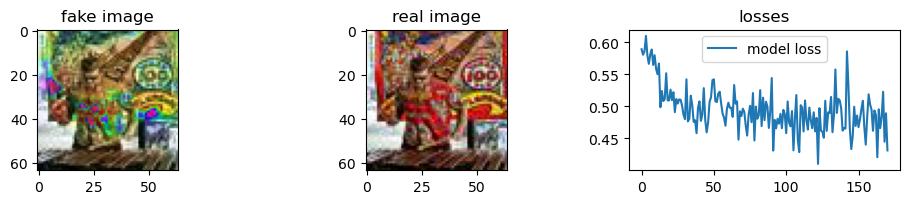

Epoch 171/1000: <==========> ------- model loss = 0.4364302158355713, time = 56.0s
Epoch 172/1000: <==========> ------- model loss = 0.4897277355194092, time = 56.0s
Epoch 173/1000: <==========> ------- model loss = 0.4659418761730194, time = 56.0s
Epoch 174/1000: <==========> ------- model loss = 0.46219906210899353, time = 56.0s
Epoch 175/1000: <==========> ------- model loss = 0.5067142248153687, time = 57.0s

Validation loss = 0.08745434880256653


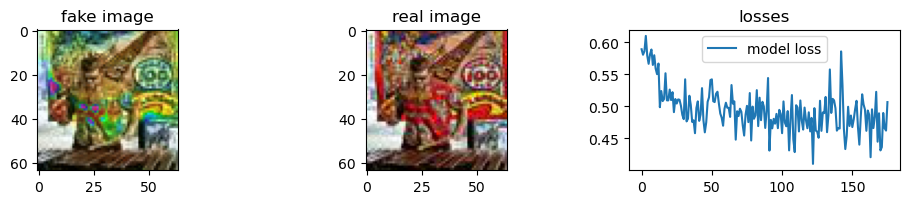

Epoch 176/1000: <==========> ------- model loss = 0.4606860876083374, time = 56.0s
Epoch 177/1000: <==========> ------- model loss = 0.4443166255950928, time = 56.0s
Epoch 178/1000: <==========> ------- model loss = 0.516308605670929, time = 56.0s
Epoch 179/1000: <==========> ------- model loss = 0.4994203448295593, time = 57.0s
Epoch 180/1000: <==========> ------- model loss = 0.4625004529953003, time = 56.0s

Validation loss = 0.0883423313498497


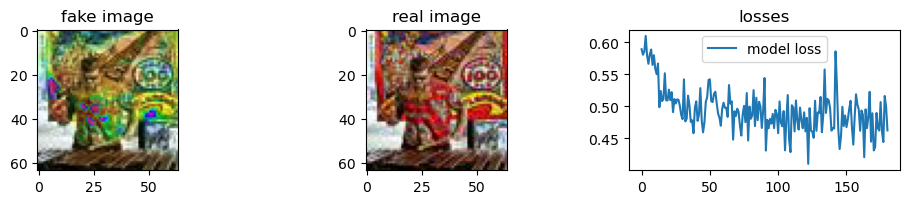

Epoch 181/1000: <==========> ------- model loss = 0.4674127399921417, time = 56.0s
Epoch 182/1000: <==========> ------- model loss = 0.43297573924064636, time = 56.0s
Epoch 183/1000: <==========> ------- model loss = 0.46054255962371826, time = 56.0s
Epoch 184/1000: <==========> ------- model loss = 0.4960910677909851, time = 56.0s
Epoch 185/1000: <==========> ------- model loss = 0.4568413496017456, time = 57.0s

Validation loss = 0.0831565409898758


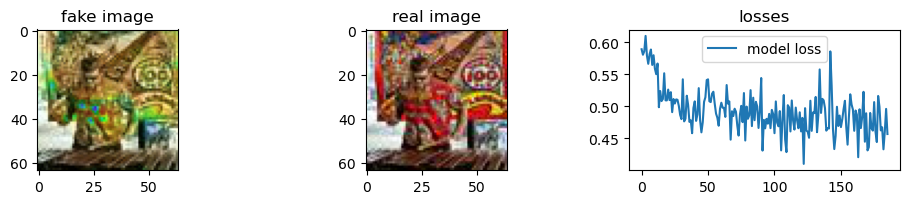

Epoch 186/1000: <==========> ------- model loss = 0.5118648409843445, time = 56.0s
Epoch 187/1000: <==========> ------- model loss = 0.4278910160064697, time = 57.0s
Epoch 188/1000: <==========> ------- model loss = 0.4786435067653656, time = 57.0s
Epoch 189/1000: <==========> ------- model loss = 0.5212640762329102, time = 56.0s
Epoch 190/1000: <==========> ------- model loss = 0.4798240065574646, time = 56.0s

Validation loss = 0.08956729620695114


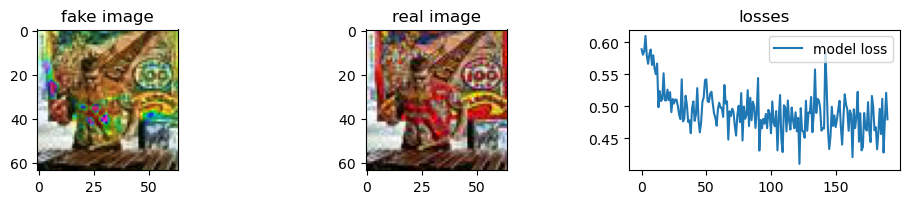

Epoch 191/1000: <==========> ------- model loss = 0.4417172968387604, time = 56.0s
Epoch 192/1000: <==========> ------- model loss = 0.5186544060707092, time = 56.0s
Epoch 193/1000: <==========> ------- model loss = 0.4941735863685608, time = 56.0s
Epoch 194/1000: <==========> ------- model loss = 0.47261661291122437, time = 56.0s
Epoch 195/1000: <==========> ------- model loss = 0.4254540801048279, time = 56.0s

Validation loss = 0.08887706696987152


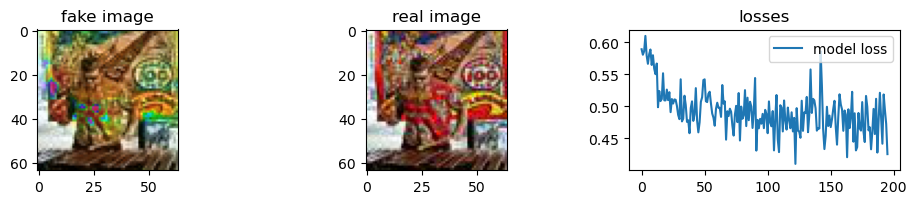

Epoch 196/1000: <==========> ------- model loss = 0.5012357234954834, time = 56.0s
Epoch 197/1000: <==========> ------- model loss = 0.47421225905418396, time = 56.0s
Epoch 198/1000: <==========> ------- model loss = 0.4598763883113861, time = 56.0s
Epoch 199/1000: <==========> ------- model loss = 0.46312958002090454, time = 56.0s
Epoch 200/1000: <==========> ------- model loss = 0.5035221576690674, time = 56.0s

Validation loss = 0.09030595421791077


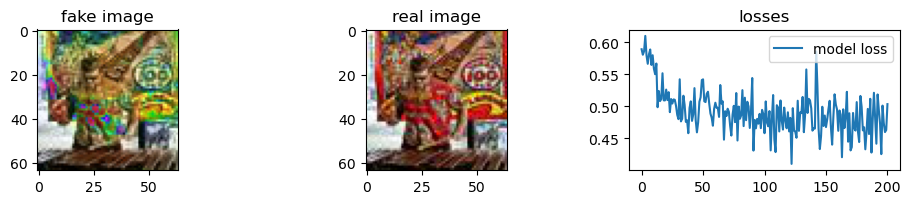

Epoch 201/1000: <==========> ------- model loss = 0.4620010256767273, time = 56.0s
Epoch 202/1000: <==========> ------- model loss = 0.47774723172187805, time = 56.0s
Epoch 203/1000: <==========> ------- model loss = 0.4398537576198578, time = 56.0s
Epoch 204/1000: <==========> ------- model loss = 0.4912542998790741, time = 56.0s
Epoch 205/1000: <==========> ------- model loss = 0.4679277837276459, time = 56.0s

Validation loss = 0.08954431116580963


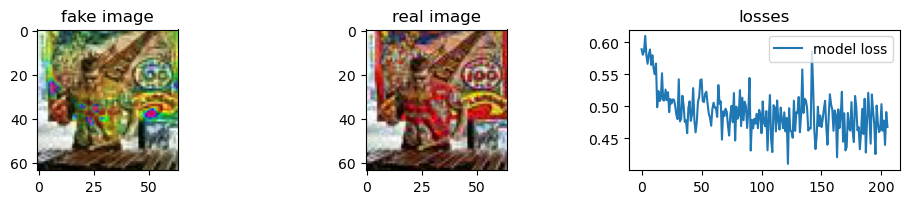

Epoch 206/1000: <==========> ------- model loss = 0.4950265884399414, time = 56.0s
Epoch 207/1000: <==========> ------- model loss = 0.4654662609100342, time = 56.0s
Epoch 208/1000: <==========> ------- model loss = 0.4642588198184967, time = 56.0s
Epoch 209/1000: <==========> ------- model loss = 0.49572476744651794, time = 56.0s
Epoch 210/1000: <==========> ------- model loss = 0.5001801252365112, time = 56.0s

Validation loss = 0.08877350389957428


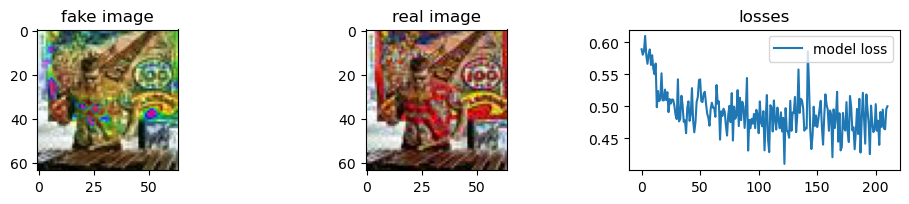

Epoch 211/1000: <==========> ------- model loss = 0.5127843022346497, time = 56.0s
Epoch 212/1000: <==========> ------- model loss = 0.4649629592895508, time = 56.0s
Epoch 213/1000: <==========> ------- model loss = 0.48876476287841797, time = 56.0s
Epoch 214/1000: <==========> ------- model loss = 0.46021705865859985, time = 56.0s
Epoch 215/1000: <==========> ------- model loss = 0.43335244059562683, time = 56.0s

Validation loss = 0.08951713144779205


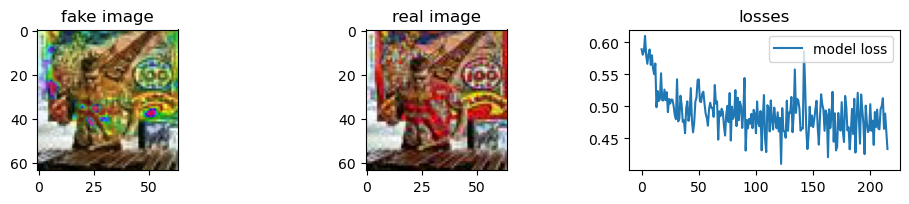

Epoch 216/1000: <==========> ------- model loss = 0.4926195740699768, time = 56.0s
Epoch 217/1000: <==========> ------- model loss = 0.42176613211631775, time = 56.0s
Epoch 218/1000: <==========> ------- model loss = 0.49978959560394287, time = 56.0s
Epoch 219/1000: <==========> ------- model loss = 0.4402191638946533, time = 56.0s
Epoch 220/1000: <==========> ------- model loss = 0.43634232878685, time = 56.0s

Validation loss = 0.08839595317840576


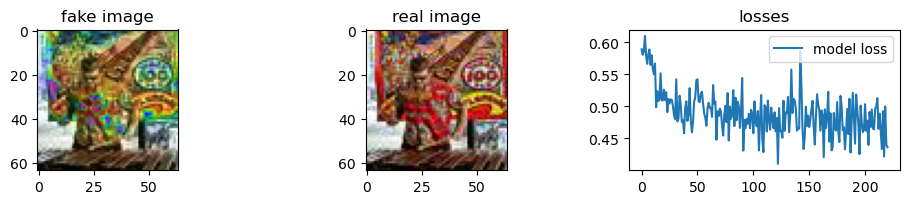

Epoch 221/1000: <==========> ------- model loss = 0.4988022446632385, time = 56.0s
Epoch 222/1000: <==========> ------- model loss = 0.43852710723876953, time = 56.0s
Epoch 223/1000: <==========> ------- model loss = 0.47295650839805603, time = 56.0s
Epoch 224/1000: <==========> ------- model loss = 0.4605708718299866, time = 56.0s
Epoch 225/1000: <==========> ------- model loss = 0.4195786416530609, time = 56.0s

Validation loss = 0.08981743454933167


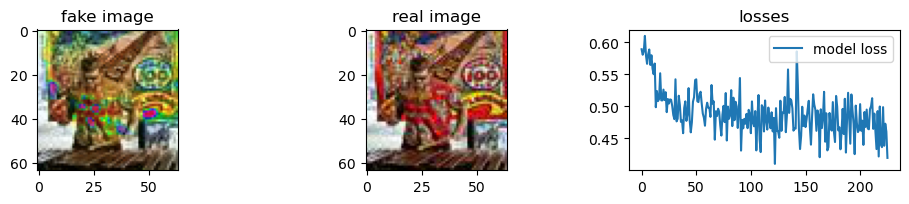

Epoch 226/1000: <==========> ------- model loss = 0.5096087455749512, time = 56.0s
Epoch 227/1000: <==========> ------- model loss = 0.462233304977417, time = 56.0s
Epoch 228/1000: <==========> ------- model loss = 0.4454742968082428, time = 56.0s
Epoch 229/1000: <==========> ------- model loss = 0.4739096462726593, time = 56.0s
Epoch 230/1000: <==========> ------- model loss = 0.45253801345825195, time = 56.0s

Validation loss = 0.08925975114107132


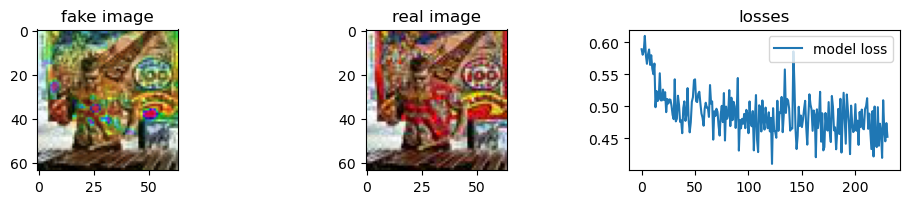

Epoch 231/1000: <==========> ------- model loss = 0.46554112434387207, time = 56.0s
Epoch 232/1000: <==========> ------- model loss = 0.47489821910858154, time = 56.0s
Epoch 233/1000: <==========> ------- model loss = 0.44902533292770386, time = 56.0s
Epoch 234/1000: <==========> ------- model loss = 0.5006766319274902, time = 56.0s
Epoch 235/1000: <==========> ------- model loss = 0.45553335547447205, time = 56.0s

Validation loss = 0.09027879685163498


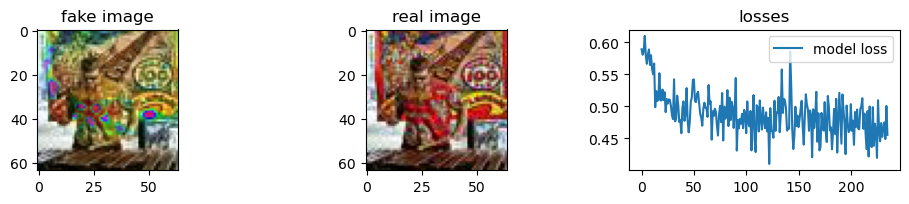

Epoch 236/1000: <==========> ------- model loss = 0.44908568263053894, time = 56.0s
Epoch 237/1000: <==========> ------- model loss = 0.48545727133750916, time = 56.0s
Epoch 238/1000: <==========> ------- model loss = 0.47325044870376587, time = 56.0s
Epoch 239/1000: <==========> ------- model loss = 0.4274696111679077, time = 56.0s
Epoch 240/1000: <==========> ------- model loss = 0.48848092555999756, time = 56.0s

Validation loss = 0.08923451602458954


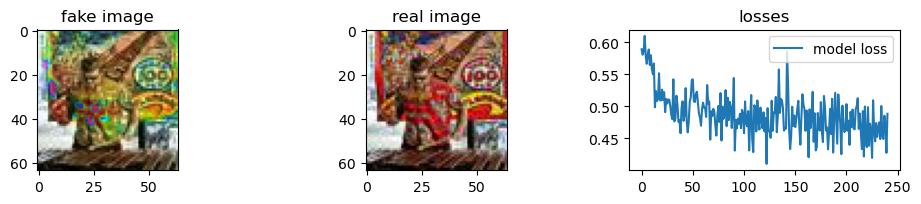

Epoch 241/1000: <==========> ------- model loss = 0.4689331650733948, time = 56.0s
Epoch 242/1000: <==========> ------- model loss = 0.4618387222290039, time = 56.0s
Epoch 243/1000: <==========> ------- model loss = 0.4459288418292999, time = 56.0s
Epoch 244/1000: <==========> ------- model loss = 0.45540645718574524, time = 56.0s
Epoch 245/1000: <==========> ------- model loss = 0.4882204532623291, time = 56.0s

Validation loss = 0.09037265181541443


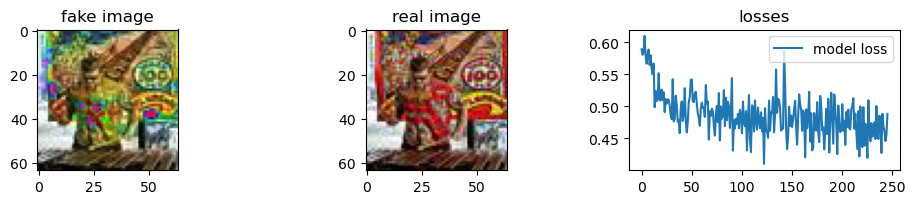

Epoch 246/1000: <==========> ------- model loss = 0.4525087773799896, time = 57.0s
Epoch 247/1000: <==========> ------- model loss = 0.46643882989883423, time = 56.0s
Epoch 248/1000: <==========> ------- model loss = 0.45402562618255615, time = 57.0s
Epoch 249/1000: <==========> ------- model loss = 0.47032755613327026, time = 56.0s
Epoch 250/1000: <==========> ------- model loss = 0.4404143989086151, time = 57.0s

Validation loss = 0.09063994884490967


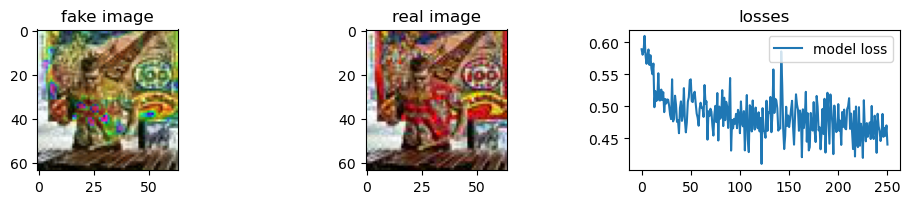

Epoch 251/1000: <==========> ------- model loss = 0.47903600335121155, time = 56.0s
Epoch 252/1000: <==========> ------- model loss = 0.4349553883075714, time = 56.0s
Epoch 253/1000: <==========> ------- model loss = 0.4598027169704437, time = 56.0s
Epoch 254/1000: <==========> ------- model loss = 0.45902228355407715, time = 56.0s
Epoch 255/1000: <==========> ------- model loss = 0.47777020931243896, time = 57.0s

Validation loss = 0.08926206082105637


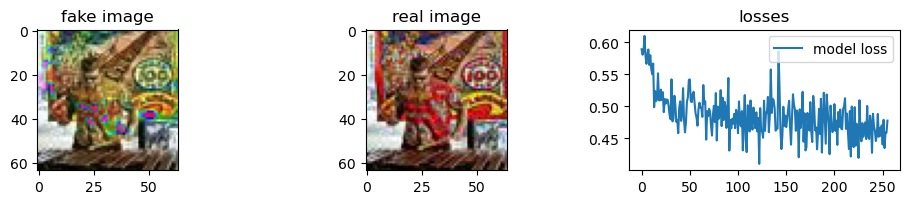

Epoch 256/1000: <==========> ------- model loss = 0.462054044008255, time = 56.0s
Epoch 257/1000: <==========> ------- model loss = 0.4304411709308624, time = 57.0s
Epoch 258/1000: <==========> ------- model loss = 0.5000494718551636, time = 56.0s
Epoch 259/1000: <==========> ------- model loss = 0.46137672662734985, time = 56.0s
Epoch 260/1000: <==========> ------- model loss = 0.4583544433116913, time = 56.0s

Validation loss = 0.09162399917840958


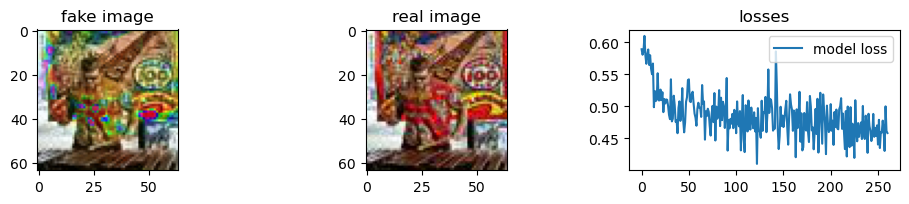

Epoch 261/1000: <==========> ------- model loss = 0.45134133100509644, time = 56.0s
Epoch 262/1000: <==========> ------- model loss = 0.47438496351242065, time = 56.0s
Epoch 263/1000: <==========> ------- model loss = 0.44560468196868896, time = 56.0s
Epoch 264/1000: <==========> ------- model loss = 0.4642387926578522, time = 56.0s
Epoch 265/1000: <==========> ------- model loss = 0.47759875655174255, time = 56.0s

Validation loss = 0.09003321826457977


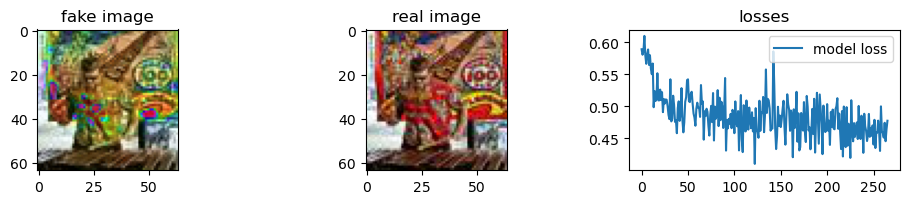

Epoch 266/1000: <==========> ------- model loss = 0.49493202567100525, time = 56.0s
Epoch 267/1000: <==========> ------- model loss = 0.4683994948863983, time = 56.0s
Epoch 268/1000: <==========> ------- model loss = 0.46746405959129333, time = 56.0s
Epoch 269/1000: <==========> ------- model loss = 0.47644299268722534, time = 56.0s
Epoch 270/1000: <==========> ------- model loss = 0.45216649770736694, time = 56.0s

Validation loss = 0.09119676053524017


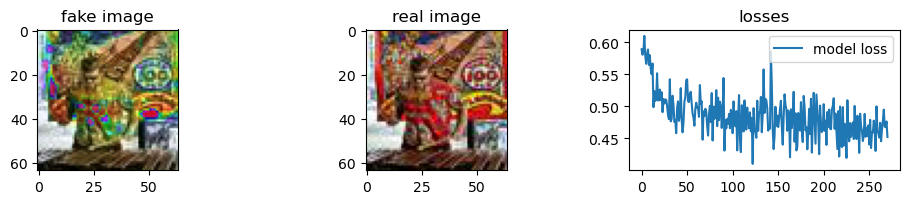

Epoch 271/1000: <==========> ------- model loss = 0.48444271087646484, time = 56.0s
Epoch 272/1000: <==========> ------- model loss = 0.49465957283973694, time = 56.0s
Epoch 273/1000: <==========> ------- model loss = 0.4582829177379608, time = 56.0s
Epoch 274/1000: <==========> ------- model loss = 0.3878746032714844, time = 56.0s
Epoch 275/1000: <==========> ------- model loss = 0.4698581397533417, time = 56.0s

Validation loss = 0.09121471643447876


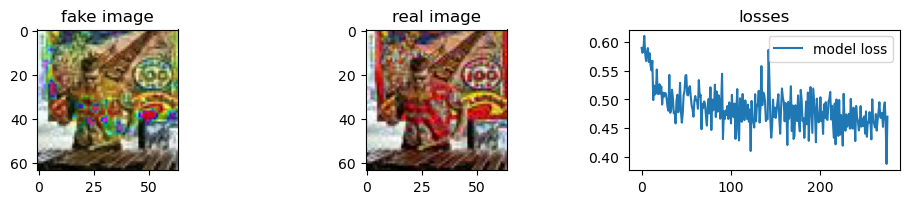

Epoch 276/1000: <==========> ------- model loss = 0.48949241638183594, time = 56.0s
Epoch 277/1000: <==========> ------- model loss = 0.4692668616771698, time = 56.0s
Epoch 278/1000: <==========> ------- model loss = 0.5119342803955078, time = 56.0s
Epoch 279/1000: <==========> ------- model loss = 0.4774947762489319, time = 56.0s
Epoch 280/1000: <==========> ------- model loss = 0.47922027111053467, time = 56.0s

Validation loss = 0.09096410125494003


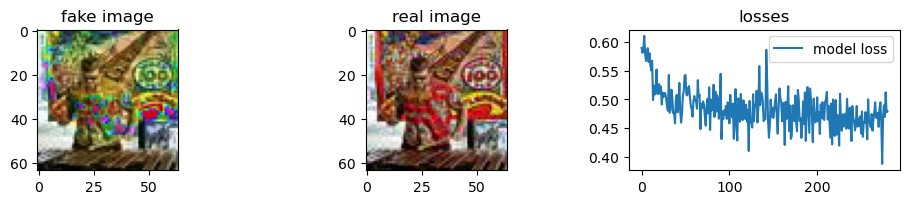

Epoch 281/1000: <==========> ------- model loss = 0.44429540634155273, time = 56.0s
Epoch 282/1000: <==========> ------- model loss = 0.45845475792884827, time = 56.0s
Epoch 283/1000: <==========> ------- model loss = 0.48179328441619873, time = 56.0s
Epoch 284/1000: <==========> ------- model loss = 0.48697152733802795, time = 56.0s
Epoch 285/1000: <==========> ------- model loss = 0.4772247076034546, time = 56.0s

Validation loss = 0.09101816266775131


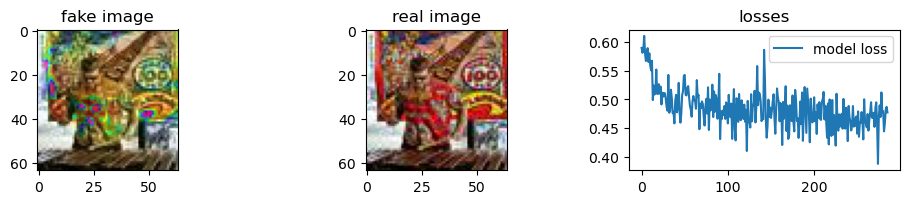

Epoch 286/1000: <==========> ------- model loss = 0.4600113332271576, time = 56.0s
Epoch 287/1000: <==========> ------- model loss = 0.43240800499916077, time = 56.0s
Epoch 288/1000: <==========> ------- model loss = 0.5036901235580444, time = 56.0s
Epoch 289/1000: <==========> ------- model loss = 0.45447680354118347, time = 56.0s
Epoch 290/1000: <==========> ------- model loss = 0.43750205636024475, time = 56.0s

Validation loss = 0.0891871452331543


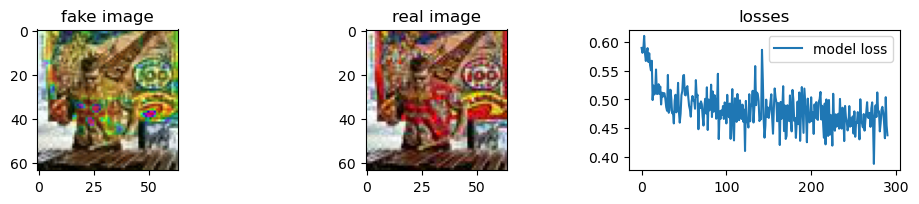

Epoch 291/1000: <==========> ------- model loss = 0.47379836440086365, time = 56.0s
Epoch 292/1000: <==========> ------- model loss = 0.46854931116104126, time = 56.0s
Epoch 293/1000: <==========> ------- model loss = 0.4504004418849945, time = 56.0s
Epoch 294/1000: <==========> ------- model loss = 0.47738873958587646, time = 56.0s
Epoch 295/1000: <==========> ------- model loss = 0.48354384303092957, time = 56.0s

Validation loss = 0.0935981497168541


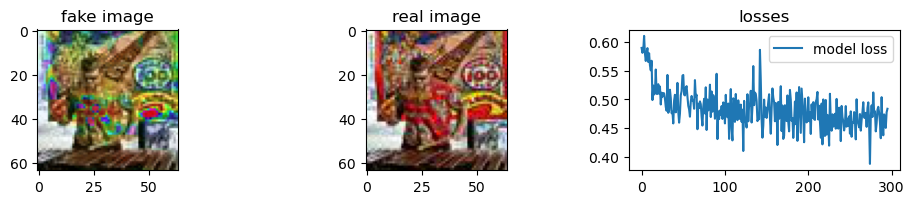

Epoch 296/1000: <==========> ------- model loss = 0.4572557210922241, time = 56.0s
Epoch 297/1000: <==========> ------- model loss = 0.48231789469718933, time = 56.0s
Epoch 298/1000: <==========> ------- model loss = 0.44926565885543823, time = 56.0s
Epoch 299/1000: <==========> ------- model loss = 0.4334260821342468, time = 56.0s
Epoch 300/1000: <==========> ------- model loss = 0.45047783851623535, time = 56.0s

Validation loss = 0.08958696573972702


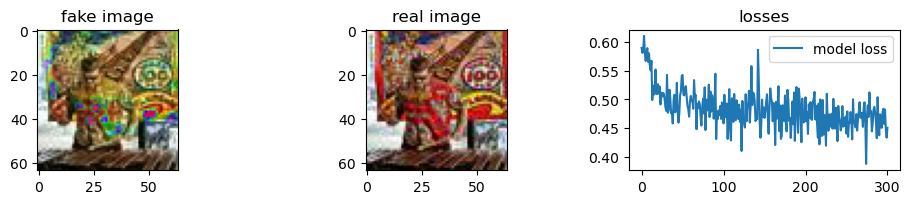

Epoch 301/1000: <==========> ------- model loss = 0.47607362270355225, time = 56.0s
Epoch 302/1000: <==========> ------- model loss = 0.4686504900455475, time = 56.0s
Epoch 303/1000: <==========> ------- model loss = 0.46487727761268616, time = 56.0s
Epoch 304/1000: <==========> ------- model loss = 0.4943768084049225, time = 56.0s
Epoch 305/1000: <==========> ------- model loss = 0.44033971428871155, time = 56.0s

Validation loss = 0.09037161618471146


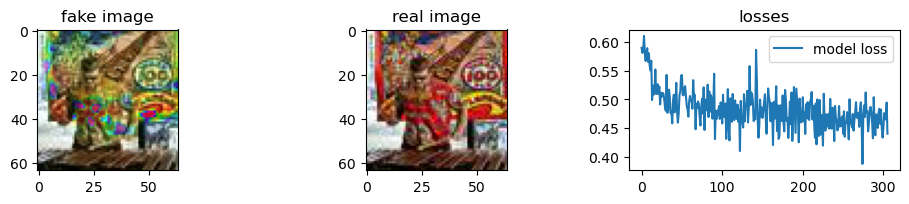

Epoch 306/1000: <==========> ------- model loss = 0.45877838134765625, time = 56.0s
Epoch 307/1000: <==========> ------- model loss = 0.5109067559242249, time = 56.0s
Epoch 308/1000: <==========> ------- model loss = 0.4237380623817444, time = 56.0s
Epoch 309/1000: <==========> ------- model loss = 0.5300222039222717, time = 56.0s
Epoch 310/1000: <==========> ------- model loss = 0.42513737082481384, time = 56.0s

Validation loss = 0.09097379446029663


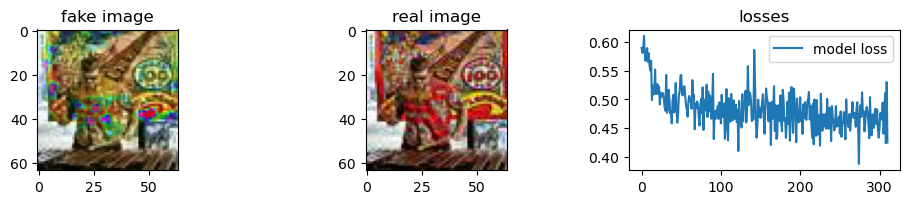

Epoch 311/1000: <==========> ------- model loss = 0.46163439750671387, time = 56.0s
Epoch 312/1000: <==========> ------- model loss = 0.4870952367782593, time = 56.0s
Epoch 313/1000: <==========> ------- model loss = 0.45381608605384827, time = 56.0s
Epoch 314/1000: <==========> ------- model loss = 0.46196866035461426, time = 56.0s
Epoch 315/1000: <==========> ------- model loss = 0.44104981422424316, time = 56.0s

Validation loss = 0.09069067239761353


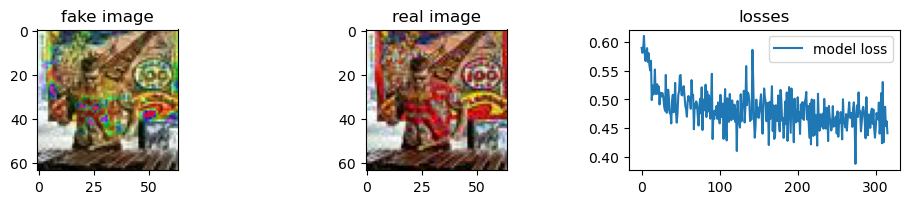

Epoch 316/1000: <==========> ------- model loss = 0.4454137682914734, time = 56.0s
Epoch 317/1000: <==========> ------- model loss = 0.4860754907131195, time = 56.0s
Epoch 318/1000: <==========> ------- model loss = 0.4272232949733734, time = 56.0s
Epoch 319/1000: <==========> ------- model loss = 0.4576253890991211, time = 56.0s
Epoch 320/1000: <==========> ------- model loss = 0.47729867696762085, time = 56.0s

Validation loss = 0.09194234758615494


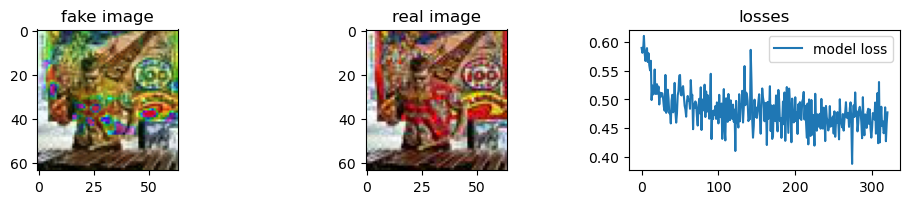

Epoch 321/1000: <==========> ------- model loss = 0.4728447496891022, time = 56.0s
Epoch 322/1000: <==========> ------- model loss = 0.44574466347694397, time = 56.0s
Epoch 323/1000: <==========> ------- model loss = 0.45269283652305603, time = 56.0s
Epoch 324/1000: <==========> ------- model loss = 0.46158739924430847, time = 56.0s
Epoch 325/1000: <==========> ------- model loss = 0.48532581329345703, time = 56.0s

Validation loss = 0.09025652706623077


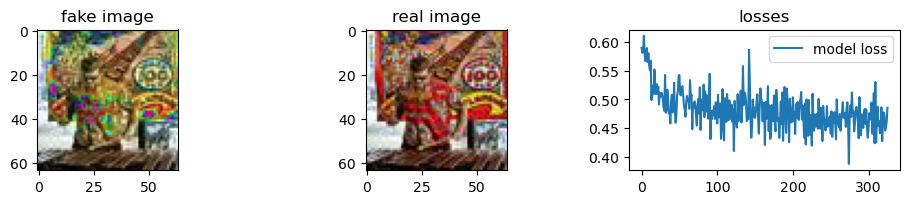

Epoch 326/1000: <==========> ------- model loss = 0.4610239565372467, time = 56.0s
Epoch 327/1000: <==========> ------- model loss = 0.4721589684486389, time = 56.0s
Epoch 328/1000: <==========> ------- model loss = 0.47309955954551697, time = 56.0s
Epoch 329/1000: <==========> ------- model loss = 0.48935675621032715, time = 56.0s
Epoch 330/1000: <==========> ------- model loss = 0.4768233299255371, time = 56.0s

Validation loss = 0.09013780206441879


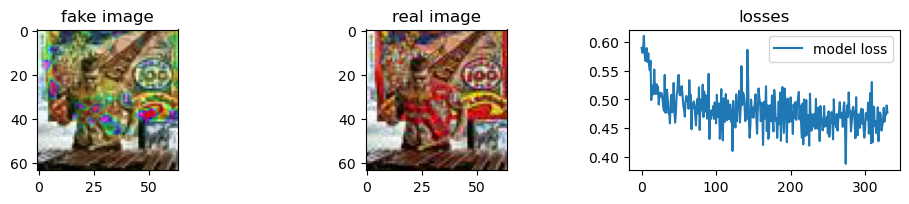

Epoch 331/1000: <==========> ------- model loss = 0.44499891996383667, time = 56.0s
Epoch 332/1000: <==========> ------- model loss = 0.46125316619873047, time = 56.0s
Epoch 333/1000: <==========> ------- model loss = 0.4773474633693695, time = 56.0s
Epoch 334/1000: <==========> ------- model loss = 0.4433760643005371, time = 56.0s
Epoch 335/1000: <==========> ------- model loss = 0.48035120964050293, time = 56.0s

Validation loss = 0.08937257528305054


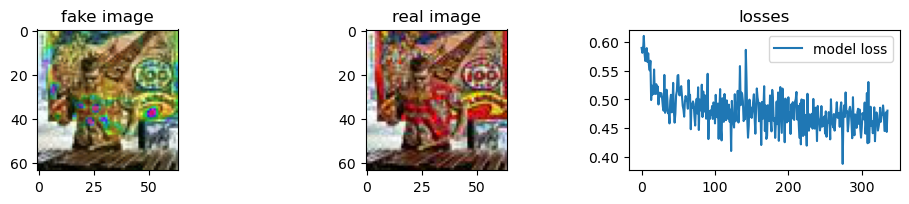

Epoch 336/1000: <==========> ------- model loss = 0.47523221373558044, time = 56.0s
Epoch 337/1000: <==========> ------- model loss = 0.4535132944583893, time = 56.0s
Epoch 338/1000: <==========> ------- model loss = 0.4724329710006714, time = 56.0s
Epoch 339/1000: <==========> ------- model loss = 0.45467573404312134, time = 56.0s
Epoch 340/1000: <==========> ------- model loss = 0.4991769790649414, time = 56.0s

Validation loss = 0.09244484454393387


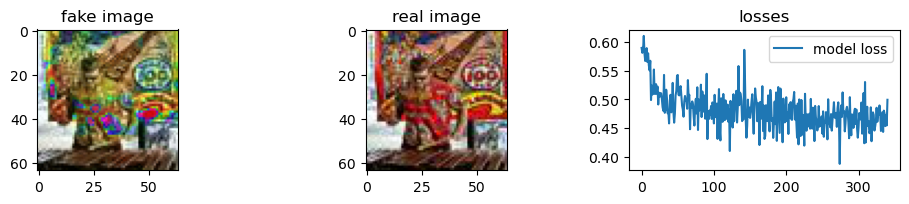

Epoch 341/1000: <==========> ------- model loss = 0.41936177015304565, time = 56.0s
Epoch 342/1000: <==========> ------- model loss = 0.4761248528957367, time = 56.0s
Epoch 343/1000: <==========> ------- model loss = 0.47575902938842773, time = 56.0s
Epoch 344/1000: <==========> ------- model loss = 0.44223734736442566, time = 56.0s
Epoch 345/1000: <==========> ------- model loss = 0.4387292265892029, time = 56.0s

Validation loss = 0.09235886484384537


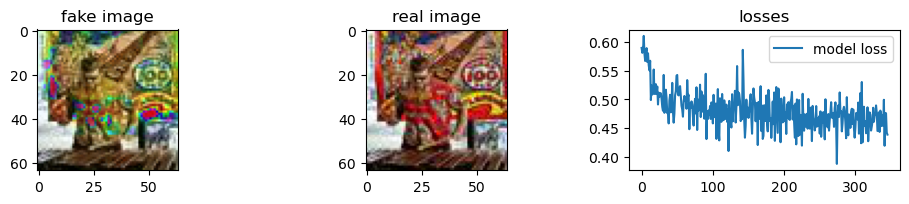

Epoch 346/1000: <==========> ------- model loss = 0.41955438256263733, time = 56.0s
Epoch 347/1000: <==========> ------- model loss = 0.4726569652557373, time = 56.0s
Epoch 348/1000: <==========> ------- model loss = 0.5335971117019653, time = 56.0s
Epoch 349/1000: <==========> ------- model loss = 0.47469136118888855, time = 56.0s
Epoch 350/1000: <==========> ------- model loss = 0.4487650394439697, time = 56.0s

Validation loss = 0.09068454802036285


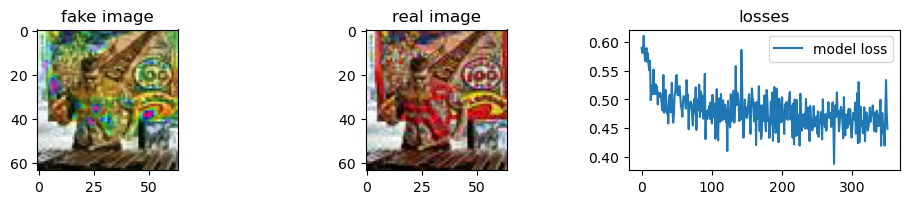

Epoch 351/1000: <==========> ------- model loss = 0.48468920588493347, time = 56.0s
Epoch 352/1000: <==========> ------- model loss = 0.4154752492904663, time = 56.0s
Epoch 353/1000: <==========> ------- model loss = 0.46555134654045105, time = 56.0s
Epoch 354/1000: <==========> ------- model loss = 0.4424274265766144, time = 56.0s
Epoch 355/1000: <==========> ------- model loss = 0.46943339705467224, time = 56.0s

Validation loss = 0.08999233692884445


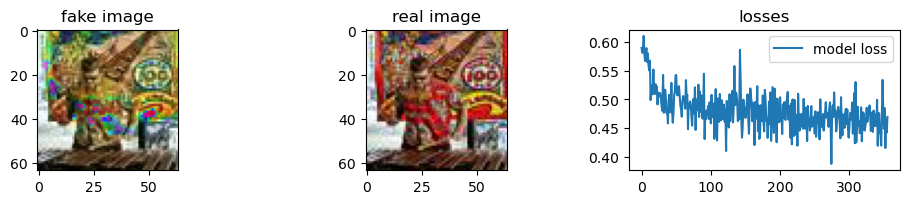

Epoch 356/1000: <==========> ------- model loss = 0.44598671793937683, time = 56.0s
Epoch 357/1000: <==========> ------- model loss = 0.47361427545547485, time = 56.0s
Epoch 358/1000: <==========> ------- model loss = 0.44087809324264526, time = 56.0s
Epoch 359/1000: <==========> ------- model loss = 0.4677751064300537, time = 56.0s
Epoch 360/1000: <==========> ------- model loss = 0.47155675292015076, time = 56.0s

Validation loss = 0.08968262374401093


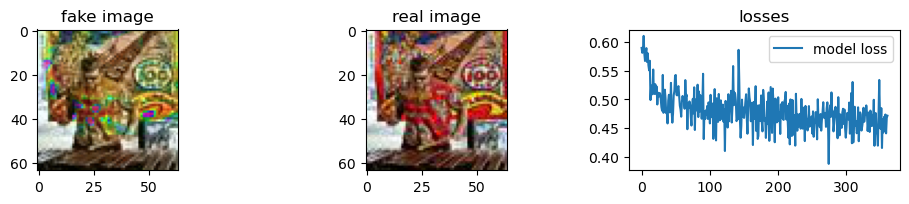

Epoch 361/1000: <==========> ------- model loss = 0.4719407558441162, time = 56.0s
Epoch 362/1000: <==========> ------- model loss = 0.44932982325553894, time = 56.0s
Epoch 363/1000: <==========> ------- model loss = 0.47216686606407166, time = 56.0s
Epoch 364/1000: <==========> ------- model loss = 0.47961053252220154, time = 56.0s
Epoch 365/1000: <==========> ------- model loss = 0.4609964191913605, time = 56.0s

Validation loss = 0.09153225272893906


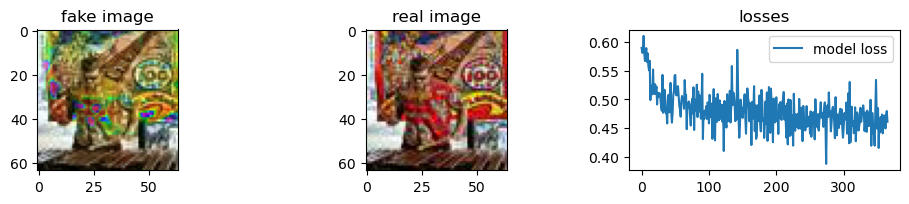

Epoch 366/1000: <==========> ------- model loss = 0.4906764626502991, time = 56.0s
Epoch 367/1000: <==========> ------- model loss = 0.3693181872367859, time = 56.0s
Epoch 368/1000: <==========> ------- model loss = 0.48718056082725525, time = 56.0s
Epoch 369/1000: <==========> ------- model loss = 0.4535347521305084, time = 56.0s
Epoch 370/1000: <==========> ------- model loss = 0.4538087844848633, time = 56.0s

Validation loss = 0.09292639791965485


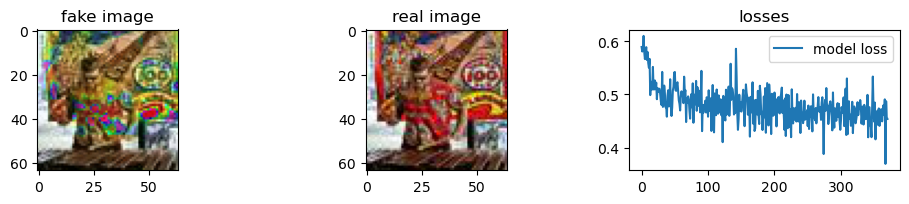

Epoch 371/1000: <==========> ------- model loss = 0.4725906252861023, time = 56.0s
Epoch 372/1000: <==========> ------- model loss = 0.43428483605384827, time = 56.0s
Epoch 373/1000: <==========> ------- model loss = 0.4903949201107025, time = 56.0s
Epoch 374/1000: <==========> ------- model loss = 0.4329235851764679, time = 56.0s
Epoch 375/1000: <==========> ------- model loss = 0.43167123198509216, time = 56.0s

Validation loss = 0.08986581116914749


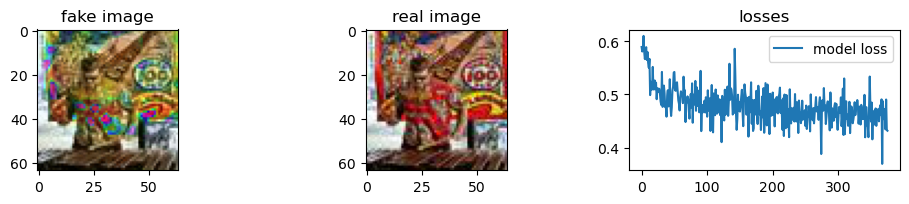

Epoch 376/1000: <==========> ------- model loss = 0.42927441000938416, time = 56.0s
Epoch 377/1000: <==========> ------- model loss = 0.4740076959133148, time = 56.0s
Epoch 378/1000: <==========> ------- model loss = 0.4783000648021698, time = 56.0s
Epoch 379/1000: <==========> ------- model loss = 0.43332231044769287, time = 56.0s
Epoch 380/1000: <==========> ------- model loss = 0.4766809046268463, time = 56.0s

Validation loss = 0.09156030416488647


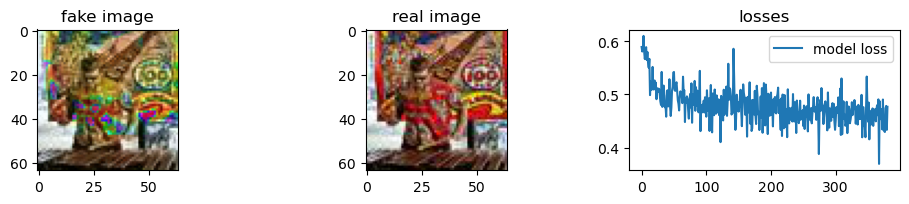

Epoch 381/1000: <==========> ------- model loss = 0.44135940074920654, time = 56.0s
Epoch 382/1000: <==========> ------- model loss = 0.44373220205307007, time = 56.0s
Epoch 383/1000: <==========> ------- model loss = 0.47786229848861694, time = 56.0s
Epoch 384/1000: <==========> ------- model loss = 0.4173135757446289, time = 56.0s
Epoch 385/1000: <==========> ------- model loss = 0.4756048619747162, time = 56.0s

Validation loss = 0.0909455418586731


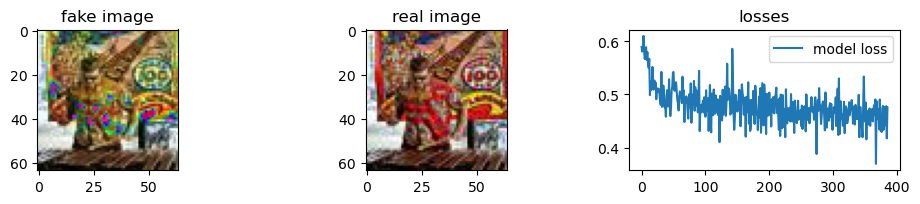

Epoch 386/1000: <==========> ------- model loss = 0.40894201397895813, time = 56.0s
Epoch 387/1000: <==========> ------- model loss = 0.4743739068508148, time = 56.0s
Epoch 388/1000: <==========> ------- model loss = 0.49656417965888977, time = 56.0s
Epoch 389/1000: <==========> ------- model loss = 0.45069974660873413, time = 56.0s
Epoch 390/1000: <==========> ------- model loss = 0.46156373620033264, time = 56.0s

Validation loss = 0.09143934398889542


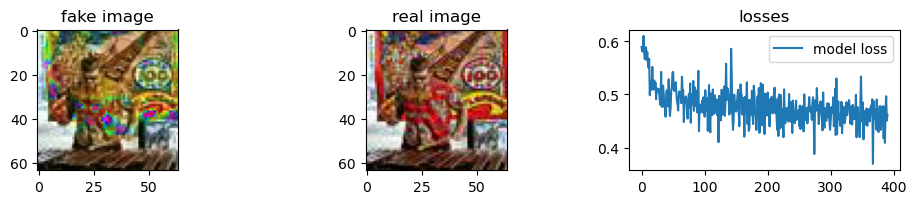

Epoch 391/1000: <==========> ------- model loss = 0.47882285714149475, time = 56.0s
Epoch 392/1000: <==========> ------- model loss = 0.4345282018184662, time = 56.0s
Epoch 393/1000: <==========> ------- model loss = 0.4431348741054535, time = 56.0s
Epoch 394/1000: <==========> ------- model loss = 0.45018744468688965, time = 56.0s
Epoch 395/1000: <==========> ------- model loss = 0.4988762438297272, time = 56.0s

Validation loss = 0.09175057709217072


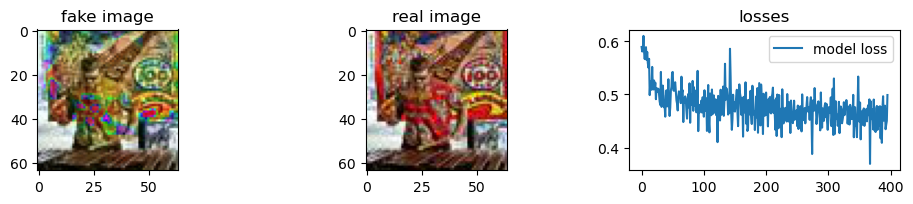

Epoch 396/1000: <==========> ------- model loss = 0.40900006890296936, time = 56.0s
Epoch 397/1000: <==========> ------- model loss = 0.45736223459243774, time = 56.0s
Epoch 398/1000: <==========> ------- model loss = 0.465178906917572, time = 56.0s
Epoch 399/1000: <==========> ------- model loss = 0.47803083062171936, time = 56.0s
Epoch 400/1000: <==========> ------- model loss = 0.4252951145172119, time = 56.0s

Validation loss = 0.09017135202884674


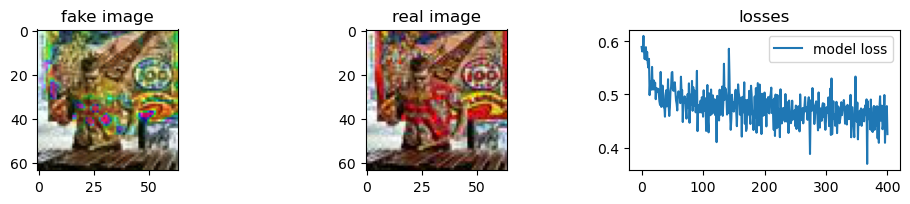

Epoch 401/1000: <==========> ------- model loss = 0.4958837330341339, time = 56.0s
Epoch 402/1000: <==========> ------- model loss = 0.46153444051742554, time = 56.0s
Epoch 403/1000: <==========> ------- model loss = 0.4479801654815674, time = 56.0s
Epoch 404/1000: <==========> ------- model loss = 0.46668490767478943, time = 56.0s
Epoch 405/1000: <==========> ------- model loss = 0.47478920221328735, time = 56.0s

Validation loss = 0.09039531648159027


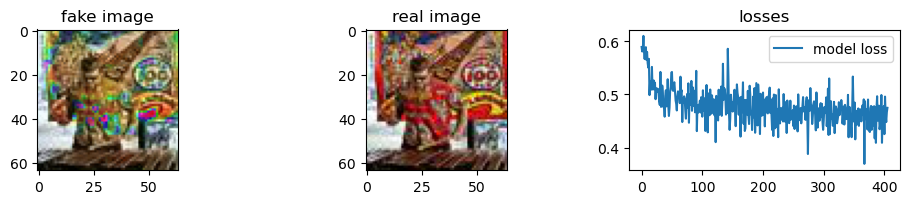

Epoch 406/1000: <==========> ------- model loss = 0.41375941038131714, time = 56.0s
Epoch 407/1000: <==========> ------- model loss = 0.45299994945526123, time = 56.0s
Epoch 408/1000: <==========> ------- model loss = 0.46273764967918396, time = 56.0s
Epoch 409/1000: <==========> ------- model loss = 0.4706990718841553, time = 56.0s
Epoch 410/1000: <==========> ------- model loss = 0.4341713488101959, time = 56.0s

Validation loss = 0.09206145256757736


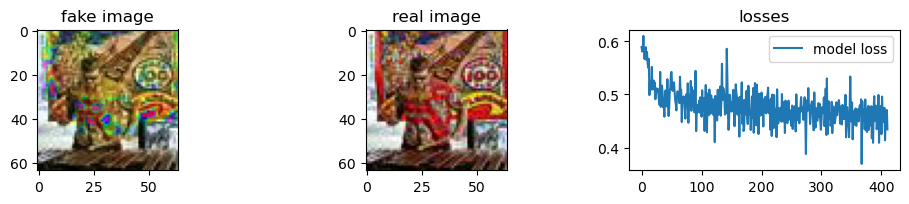

Epoch 411/1000: <==========> ------- model loss = 0.42589300870895386, time = 56.0s
Epoch 412/1000: <==========> ------- model loss = 0.41086050868034363, time = 56.0s
Epoch 413/1000: <==========> ------- model loss = 0.44503864645957947, time = 56.0s
Epoch 414/1000: <==========> ------- model loss = 0.441914826631546, time = 56.0s
Epoch 415/1000: <==========> ------- model loss = 0.4283577501773834, time = 56.0s

Validation loss = 0.09234339743852615


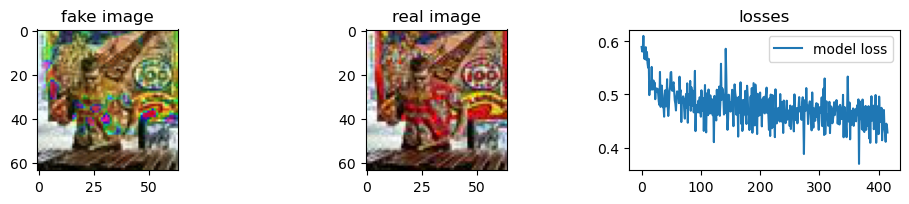

Epoch 416/1000: <==========> ------- model loss = 0.487876296043396, time = 56.0s
Epoch 417/1000: <==========> ------- model loss = 0.46427589654922485, time = 56.0s
Epoch 418/1000: <==========> ------- model loss = 0.4588127136230469, time = 56.0s
Epoch 419/1000: <==========> ------- model loss = 0.4834417998790741, time = 56.0s
Epoch 420/1000: <==========> ------- model loss = 0.47850310802459717, time = 56.0s

Validation loss = 0.09066887944936752


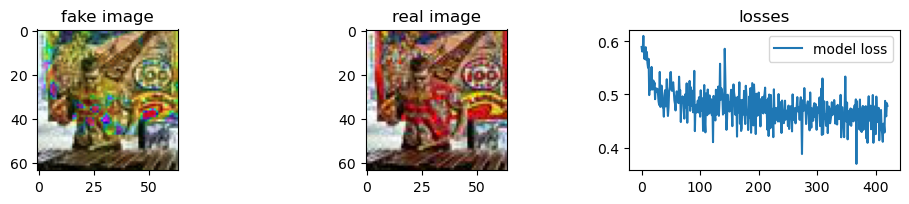

Epoch 421/1000: <==========> ------- model loss = 0.45072197914123535, time = 56.0s
Epoch 422/1000: <==========> ------- model loss = 0.4673031270503998, time = 56.0s
Epoch 423/1000: <==========> ------- model loss = 0.43225401639938354, time = 56.0s
Epoch 424/1000: <==========> ------- model loss = 0.5320683717727661, time = 56.0s
Epoch 425/1000: <==========> ------- model loss = 0.47273460030555725, time = 56.0s

Validation loss = 0.08555090427398682


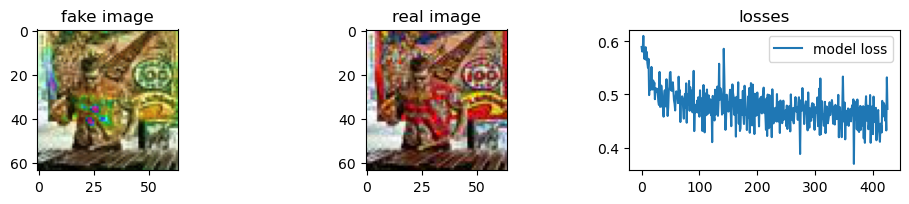

Epoch 426/1000: <==========> ------- model loss = 0.4417029023170471, time = 56.0s
Epoch 427/1000: <==========> ------- model loss = 0.4684883952140808, time = 56.0s
Epoch 428/1000: <==========> ------- model loss = 0.4776049256324768, time = 56.0s
Epoch 429/1000: <==========> ------- model loss = 0.4560965895652771, time = 56.0s
Epoch 430/1000: <==========> ------- model loss = 0.4623304009437561, time = 56.0s

Validation loss = 0.09103439003229141


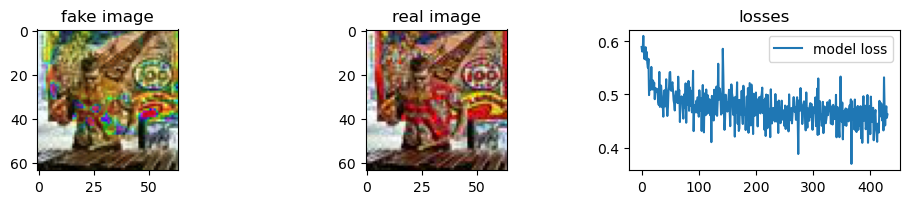

Epoch 431/1000: <==========> ------- model loss = 0.42980146408081055, time = 56.0s
Epoch 432/1000: <==========> ------- model loss = 0.44066914916038513, time = 56.0s
Epoch 433/1000: <==========> ------- model loss = 0.478116512298584, time = 56.0s
Epoch 434/1000: <==========> ------- model loss = 0.43143901228904724, time = 56.0s
Epoch 435/1000: <==========> ------- model loss = 0.43347638845443726, time = 57.0s

Validation loss = 0.09012344479560852


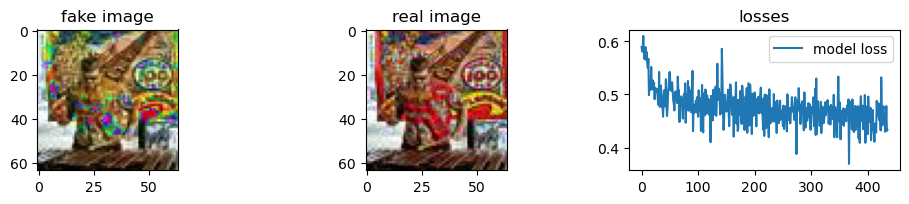

Epoch 436/1000: <==========> ------- model loss = 0.4715266823768616, time = 56.0s
Epoch 437/1000: <==========> ------- model loss = 0.5025442242622375, time = 56.0s
Epoch 438/1000: <==========> ------- model loss = 0.5013444423675537, time = 56.0s
Epoch 439/1000: <==========> ------- model loss = 0.4611431658267975, time = 56.0s
Epoch 440/1000: <==========> ------- model loss = 0.4228653311729431, time = 56.0s

Validation loss = 0.09041436016559601


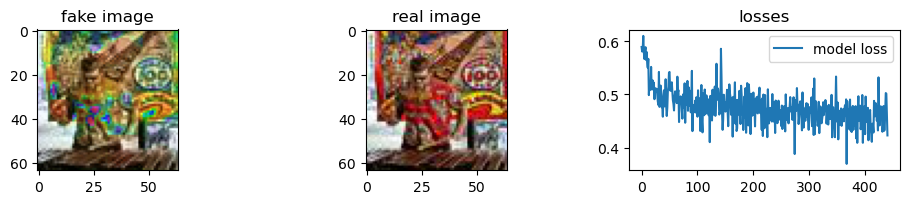

Epoch 441/1000: <==========> ------- model loss = 0.4450991451740265, time = 56.0s
Epoch 442/1000: <==========> ------- model loss = 0.45332249999046326, time = 56.0s
Epoch 443/1000: <==========> ------- model loss = 0.4633513391017914, time = 56.0s
Epoch 444/1000: <==========> ------- model loss = 0.4405653476715088, time = 56.0s
Epoch 445/1000: <==========> ------- model loss = 0.4397209584712982, time = 56.0s

Validation loss = 0.09266079217195511


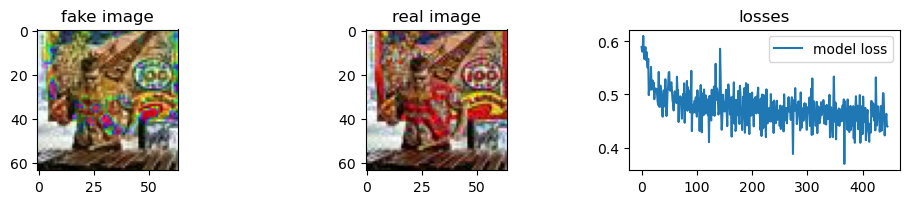

Epoch 446/1000: <==========> ------- model loss = 0.4607727825641632, time = 56.0s
Epoch 447/1000: <==========> ------- model loss = 0.461369127035141, time = 56.0s
Epoch 448/1000: <==========> ------- model loss = 0.4821852147579193, time = 56.0s
Epoch 449/1000: <==========> ------- model loss = 0.48054739832878113, time = 56.0s
Epoch 450/1000: <==========> ------- model loss = 0.4160049259662628, time = 56.0s

Validation loss = 0.09142451733350754


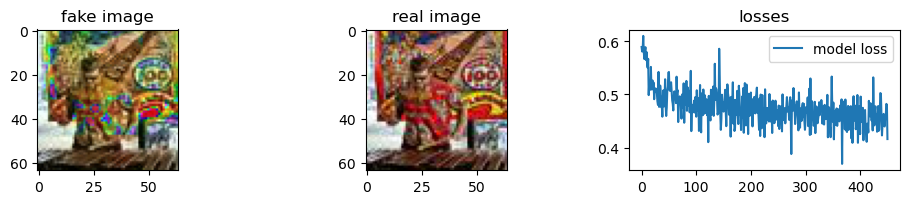

Epoch 451/1000: <==========> ------- model loss = 0.49277999997138977, time = 56.0s
Epoch 452/1000: <==========> ------- model loss = 0.44720977544784546, time = 56.0s
Epoch 453/1000: <==========> ------- model loss = 0.4631041884422302, time = 56.0s
Epoch 454/1000: <==========> ------- model loss = 0.4514046609401703, time = 56.0s
Epoch 455/1000: <==========> ------- model loss = 0.4556434154510498, time = 56.0s

Validation loss = 0.09206409752368927


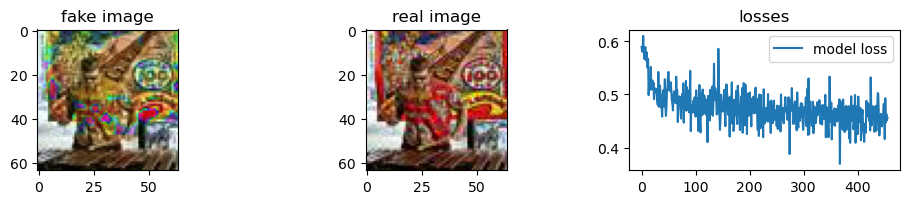

Epoch 456/1000: <==========> ------- model loss = 0.46000936627388, time = 56.0s
Epoch 457/1000: <==========> ------- model loss = 0.4526591897010803, time = 56.0s
Epoch 458/1000: <==========> ------- model loss = 0.4246535003185272, time = 56.0s
Epoch 459/1000: <==========> ------- model loss = 0.4198091924190521, time = 56.0s
Epoch 460/1000: <==========> ------- model loss = 0.4372405707836151, time = 56.0s

Validation loss = 0.09265908598899841


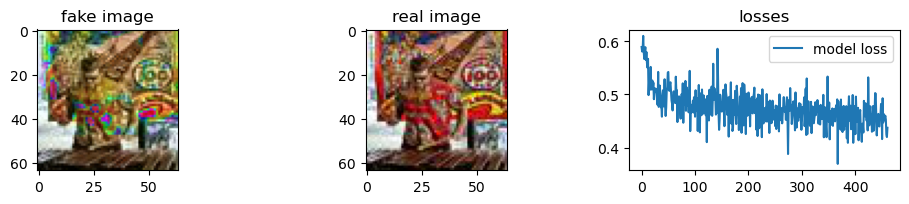

Epoch 461/1000: <==========> ------- model loss = 0.4766848087310791, time = 56.0s
Epoch 462/1000: <==========> ------- model loss = 0.47516268491744995, time = 56.0s
Epoch 463/1000: <==========> ------- model loss = 0.45433327555656433, time = 56.0s
Epoch 464/1000: <==========> ------- model loss = 0.46685272455215454, time = 56.0s
Epoch 465/1000: <==========> ------- model loss = 0.49308258295059204, time = 56.0s

Validation loss = 0.09127344936132431


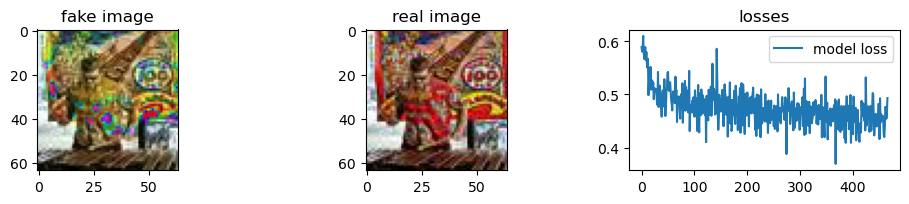

Epoch 466/1000: <==========> ------- model loss = 0.4667666256427765, time = 56.0s
Epoch 467/1000: <==========> ------- model loss = 0.47622543573379517, time = 56.0s
Epoch 468/1000: <==========> ------- model loss = 0.4310302734375, time = 56.0s
Epoch 469/1000: <==========> ------- model loss = 0.4548093378543854, time = 56.0s
Epoch 470/1000: <==========> ------- model loss = 0.4119461476802826, time = 56.0s

Validation loss = 0.09215331822633743


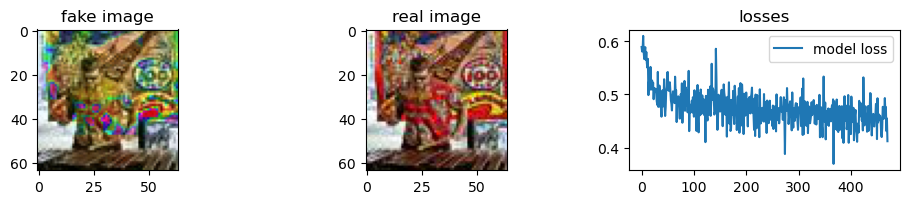

Epoch 471/1000: <==========> ------- model loss = 0.46405529975891113, time = 56.0s
Epoch 472/1000: <==========> ------- model loss = 0.45061200857162476, time = 56.0s
Epoch 473/1000: <==========> ------- model loss = 0.47070741653442383, time = 56.0s
Epoch 474/1000: <==========> ------- model loss = 0.4904455542564392, time = 56.0s
Epoch 475/1000: <==========> ------- model loss = 0.45122066140174866, time = 56.0s

Validation loss = 0.0916525200009346


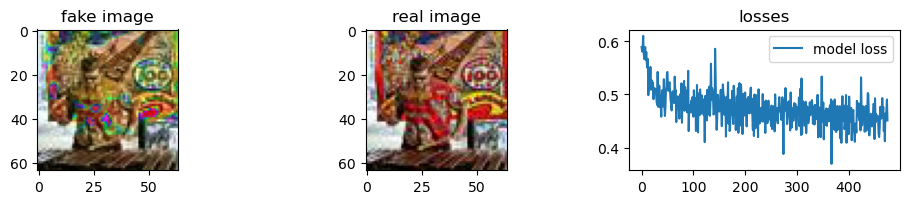

Epoch 476/1000: <==========> ------- model loss = 0.49796271324157715, time = 56.0s
Epoch 477/1000: <==========> ------- model loss = 0.468227744102478, time = 56.0s
Epoch 478/1000: <==========> ------- model loss = 0.495087206363678, time = 56.0s
Epoch 479/1000: <==========> ------- model loss = 0.4723409116268158, time = 56.0s
Epoch 480/1000: <==========> ------- model loss = 0.45145148038864136, time = 56.0s

Validation loss = 0.09272131323814392


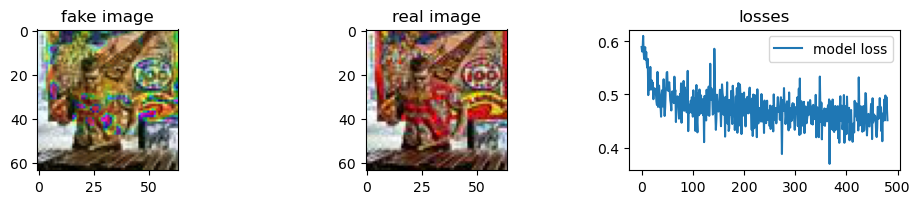

Epoch 481/1000: <==========> ------- model loss = 0.4674510359764099, time = 56.0s
Epoch 482/1000: <==========> ------- model loss = 0.4434453845024109, time = 56.0s
Epoch 483/1000: <==========> ------- model loss = 0.44084104895591736, time = 56.0s
Epoch 484/1000: <==========> ------- model loss = 0.4522005617618561, time = 56.0s
Epoch 485/1000: <==========> ------- model loss = 0.47762441635131836, time = 56.0s

Validation loss = 0.09272792190313339


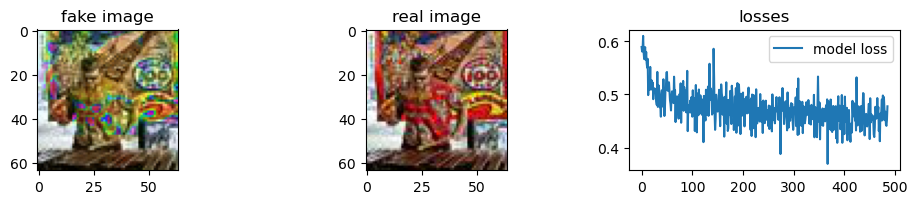

Epoch 486/1000: <==========> ------- model loss = 0.4554993212223053, time = 56.0s
Epoch 487/1000: <==========> ------- model loss = 0.4508407413959503, time = 56.0s
Epoch 488/1000: <==========> ------- model loss = 0.46325260400772095, time = 56.0s
Epoch 489/1000: <==========> ------- model loss = 0.4535040855407715, time = 56.0s
Epoch 490/1000: <==========> ------- model loss = 0.45271411538124084, time = 56.0s

Validation loss = 0.09192363917827606


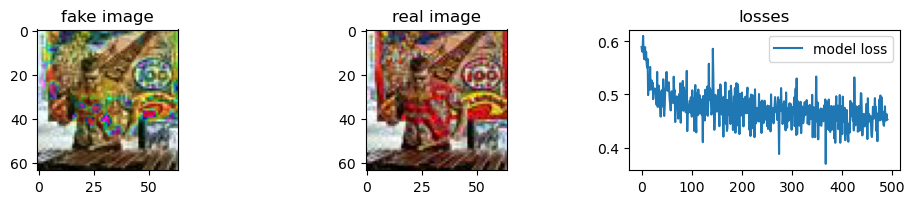

Epoch 491/1000: <==========> ------- model loss = 0.43103063106536865, time = 56.0s
Epoch 492/1000: <==========> ------- model loss = 0.4721035659313202, time = 56.0s
Epoch 493/1000: <==========> ------- model loss = 0.48620936274528503, time = 56.0s
Epoch 494/1000: <==========> ------- model loss = 0.4331929087638855, time = 56.0s
Epoch 495/1000: <==========> ------- model loss = 0.46333006024360657, time = 56.0s

Validation loss = 0.09199405461549759


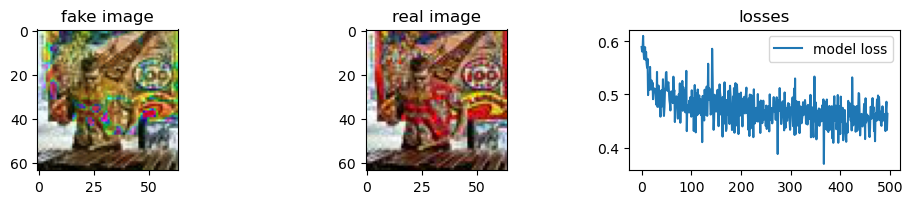

Epoch 496/1000: <==========> ------- model loss = 0.4728762209415436, time = 56.0s
Epoch 497/1000: <==========> ------- model loss = 0.4612756371498108, time = 56.0s
Epoch 498/1000: <==========> ------- model loss = 0.471157968044281, time = 56.0s
Epoch 499/1000: <==========> ------- model loss = 0.47826439142227173, time = 56.0s
Epoch 500/1000: <==========> ------- model loss = 0.4497590661048889, time = 56.0s

Validation loss = 0.09318742901086807


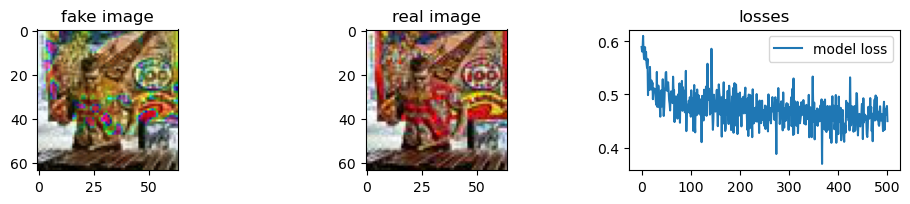

Epoch 501/1000: <==========> ------- model loss = 0.44832807779312134, time = 56.0s
Epoch 502/1000: <==========> ------- model loss = 0.4156390130519867, time = 56.0s
Epoch 503/1000: <==========> ------- model loss = 0.42670807242393494, time = 56.0s
Epoch 504/1000: <==========> ------- model loss = 0.47305282950401306, time = 57.0s
Epoch 505/1000: <==========> ------- model loss = 0.48522067070007324, time = 57.0s

Validation loss = 0.09255218505859375


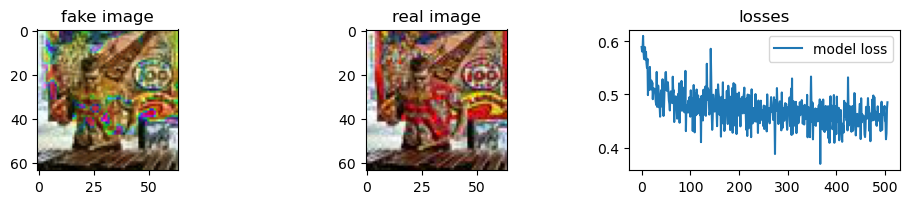

Epoch 506/1000: <==========> ------- model loss = 0.43889060616493225, time = 57.0s
Epoch 507/1000: <==========> ------- model loss = 0.45225760340690613, time = 57.0s
Epoch 508/1000: <==========> ------- model loss = 0.4440537989139557, time = 57.0s
Epoch 509/1000: <==========> ------- model loss = 0.4316699504852295, time = 57.0s
Epoch 510/1000: <==========> ------- model loss = 0.4534154534339905, time = 57.0s


KeyboardInterrupt: 

In [9]:
%matplotlib inline
loss = train_model3(model, train_loader, epochs = 1000, device = DEVICE)

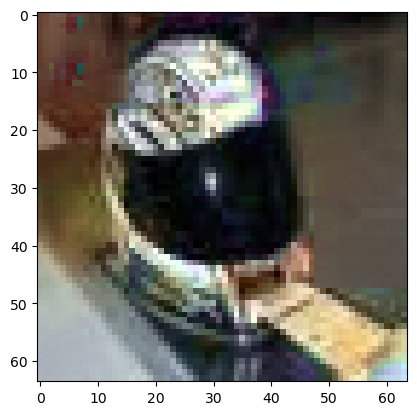

In [11]:
image = next(iter(val_loader))
model.to(DEVICE)
fake_image = model.predict(image[0])
plt.imshow(fake_image)

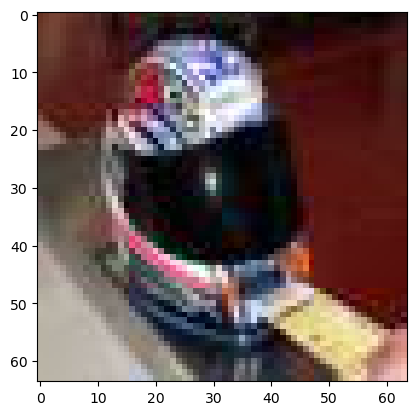

In [12]:
topillow = torchvision.transforms.ToPILImage('HSV')
plt.imshow(topillow(torch.hstack((image[1], image[0]))[0]))